<a href="https://colab.research.google.com/github/Akibu-nasir/osm_buildings_classification/blob/main/Pushkinsky_building_type_predict.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
!pip install osmium pandas geopandas shapely osmnx numpy scikit-learn graphviz matplotlib jenkspy pyrosm --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 82.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 4.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 65.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.5/100.5 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.9/650.9 kB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 64.0 MB/s eta 0:00:00


In [7]:
import osmium as osm
import pandas as pd
import geopandas
import os.path
import shapely.wkb as wkblib
wkbfab = osm.geom.WKBFactory()
import numpy as np
import shapely.geometry
import pyrosm
import os

from sklearn import tree
import graphviz
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
from sklearn import preprocessing
import jenkspy
from sklearn.metrics import PrecisionRecallDisplay

In [8]:
class AreaHandler(osm.SimpleHandler):
    def __init__(self):
        osm.SimpleHandler.__init__(self)
        self.num_polys = 0
        self.osm_data = []
        self.roads_data = []
        self.landuse_data = []
        self.amenity_data = []

    def count_polygons(self):
        self.num_polys += 1

    def way(self, w):
        try:
            wkb = wkbfab.create_linestring(w)
            line = wkblib.loads(wkb, hex=True)
            for tag in w.tags:
                if (tag.k=='highway'):
                    self.roads_data.append([w.id,
                                       tag.v,
                                       line])
        except Exception:
            pass

    def area(self, a):
        try:
            wkb = wkbfab.create_multipolygon(a)
            self.count_polygons()
            # load into shapely
            poly = wkblib.loads(wkb, hex=True)
            for tag in a.tags:
                if (tag.k=='building'):
                    self.osm_data.append([a.id,
                                    tag.v,
                                    list(poly.geoms)[0],
                                    list(dict(a.tags).keys()),
                                    dict(a.tags)])
                if (tag.k=='landuse'):
                    self.landuse_data.append([tag.v,
                                    list(poly.geoms)[0],
                                    ])
                if (tag.k == 'amenity'):
                    self.amenity_data.append([tag.v,
                                    list(poly.geoms)[0],
                                    ])
        except Exception:
            pass

In [9]:
import osmnx as ox
import geopandas as gpd

# Configure OSMnx (keep as is)
ox.settings.log_console = True
ox.settings.cache_folder = "./osmnx_cache"
ox.settings.use_cache = True

query = "Pushkinsky District, Saint Petersburg, Russia"
area_polygon = ox.geocode_to_gdf(query).geometry.iloc[0]

# Download building footprints
push_buildings = ox.features_from_polygon(
    area_polygon,
        tags={"building": True}
        )

        # Filter only polygons (exclude points, lines)
push_buildings = push_buildings[push_buildings.geom_type.isin(["Polygon", "MultiPolygon"])]


cols = ["name", "addr:street", "addr:housenumber", "building", "geometry"]
push_buildings = push_buildings[cols].reset_index(drop=True)

print(f"Downloaded {len(push_buildings)} buildings")

print(push_buildings['building'].unique())
print(push_buildings['building'].value_counts())

push_buildings.to_file("vasilievsky_island_buildings.geojson", driver="GeoJSON")
push_buildings.to_file("vasilievsky_island_buildings.shp")


Downloaded 21286 buildings
['school' 'government' 'dormitory' 'yes' 'community_centre' 'apartments'
 'castle' 'stable' 'palace' 'hospital' 'museum' 'mansion' 'university'
 'roof' 'retail' 'commercial' 'gazebo' 'warehouse' 'train_station'
 'service' 'kiosk' 'chapel' 'tower' 'cathedral' 'bath' 'garage' 'hangar'
 'industrial' 'kindergarten' 'house' 'triumphal_arch' 'garages'
 'greenhouse' 'shed' 'detached' 'church' 'fire_station' 'civic' 'clinic'
 'parking' 'construction' 'gate' 'guardhouse' 'ruins' 'no' 'residential'
 'office' 'policlinic' 'hotel' 'toilets' 'public' 'store' 'bunker'
 'college' 'manufacture' 'semidetached_house' 'bell_tower' 'fuel'
 'terrace' 'water_tower' 'collapsed' 'temple' 'pavilion' 'farm_auxiliary'
 'bridge' 'carport' 'storage_tank' 'container' 'marquee' 'allotment_house'
 'tent' 'sports_centre' 'grandstand' 'static_caravan']
building
yes               13554
house              2633
apartments         1310
detached            765
greenhouse          536
             

/tmp/ipython-input-9-2807306924.py:31: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  push_buildings.to_file("vasilievsky_island_buildings.shp")
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'addr:street' to 'addr_stree'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'addr:housenumber' to 'addr_house'
  ogr_write(


In [10]:
push_buildings.head()

,name,addr:street,addr:housenumber,building,geometry
0,NaN,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,NaN,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,NaN,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."


In [11]:
!pip install folium matplotlib mapclassify --quiet
push_buildings.explore()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 14.5 MB/s eta 0:00:00


In [12]:
push_buildings.to_file("pushkinsky_district_buildings.shp")

/tmp/ipython-input-12-3369004280.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  push_buildings.to_file("pushkinsky_district_buildings.shp")
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'addr:street' to 'addr_stree'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'addr:housenumber' to 'addr_house'
  ogr_write(


In [13]:
# load official buildings
buildings_path = "/content/pushkinsky_district_buildings.shp"
official_buildings = geopandas.read_file(buildings_path)

In [14]:
official_buildings.shape

(21286, 5)

In [15]:
official_buildings.columns

Index(['name', 'addr_stree', 'addr_house', 'building', 'geometry'], dtype='object')

In [16]:
official_buildings = official_buildings.rename(columns={'building': 'official_type',})

In [17]:
official_buildings.head()

,name,addr_stree,addr_house,official_type,geometry
0,None,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,None,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,None,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."


In [18]:
official_buildings.groupby(['official_type']).count()

,name,addr_stree,addr_house,geometry
official_type,,,,
allotment_house,0,0,0,80
apartments,21,1267,1306,1310
bath,2,1,1,2
bell_tower,1,0,0,1
bridge,0,0,0,3
...,...,...,...,...
triumphal_arch,1,1,1,1
university,2,8,8,10
warehouse,6,53,54,67


In [19]:
#dissolved_buildings = official_buildings.dissolve()

In [20]:
#dissolved_buildings.bounds

In [21]:
official_buildings.head()

,name,addr_stree,addr_house,official_type,geometry
0,None,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,None,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,None,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."


In [22]:
official_buildings.groupby('official_type').count()

,name,addr_stree,addr_house,geometry
official_type,,,,
allotment_house,0,0,0,80
apartments,21,1267,1306,1310
bath,2,1,1,2
bell_tower,1,0,0,1
bridge,0,0,0,3
...,...,...,...,...
triumphal_arch,1,1,1,1
university,2,8,8,10
warehouse,6,53,54,67


In [23]:
drop_list = ['Agricultural','Foundation/Ruin','Garage/Shed','Misc','Parking Structure','Tank', 'shed']
official_buildings.drop(official_buildings[(official_buildings['official_type'].isin(drop_list))].index,\
                        inplace = True)
official_buildings.reset_index(inplace=True, drop=True)

In [24]:
official_buildings.head()

,name,addr_stree,addr_house,official_type,geometry
0,None,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,None,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,None,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."


In [25]:
official_buildings.shape

(21212, 5)

In [26]:
official_buildings.groupby('official_type').count()

,name,addr_stree,addr_house,geometry
official_type,,,,
allotment_house,0,0,0,80
apartments,21,1267,1306,1310
bath,2,1,1,2
bell_tower,1,0,0,1
bridge,0,0,0,3
...,...,...,...,...
triumphal_arch,1,1,1,1
university,2,8,8,10
warehouse,6,53,54,67


In [43]:
buildings_path = "/content/pushkinsky_district_buildings.shp"
official_buildings = geopandas.read_file(buildings_path)
official_buildings.head(40)

,name,addr_stree,addr_house,building,geometry
0,None,улица Генерала Хазова,18,school,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,government,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,dormitory,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,None,Малая улица,6,yes,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,None,Школьная улица,2 литА,community_centre,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."
5,None,улица Генерала Хазова,7,school,"POLYGON ((30.40012 59.73628, 30.40012 59.7364,..."
6,None,Берёзовая улица,25,apartments,"POLYGON ((30.42595 59.68763, 30.42595 59.68765..."
7,None,Малиновская улица,15,apartments,"POLYGON ((30.42179 59.69625, 30.42182 59.69625..."
8,None,Павловское шоссе,103,apartments,"POLYGON ((30.42588 59.6945, 30.42587 59.6945, ..."
9,None,улица Архитектора Данини,3,apartments,"POLYGON ((30.42018 59.6953, 30.42027 59.69533,..."


In [44]:
# Access the 'building' column and call the .unique() method
unique_building_types = official_buildings['building'].unique()

# Print the result
print(unique_building_types)

['school' 'government' 'dormitory' 'yes' 'community_centre' 'apartments'
 'castle' 'stable' 'palace' 'hospital' 'museum' 'mansion' 'university'
 'roof' 'retail' 'commercial' 'gazebo' 'warehouse' 'train_station'
 'service' 'kiosk' 'chapel' 'tower' 'cathedral' 'bath' 'garage' 'hangar'
 'industrial' 'kindergarten' 'house' 'triumphal_arch' 'garages'
 'greenhouse' 'shed' 'detached' 'church' 'fire_station' 'civic' 'clinic'
 'parking' 'construction' 'gate' 'guardhouse' 'ruins' 'no' 'residential'
 'office' 'policlinic' 'hotel' 'toilets' 'public' 'store' 'bunker'
 'college' 'manufacture' 'semidetached_house' 'bell_tower' 'fuel'
 'terrace' 'water_tower' 'collapsed' 'temple' 'pavilion' 'farm_auxiliary'
 'bridge' 'carport' 'storage_tank' 'container' 'marquee' 'allotment_house'
 'tent' 'sports_centre' 'grandstand' 'static_caravan']


In [45]:
# This will show each unique building type and how many times it appears
building_counts = official_buildings['building'].value_counts()

# Print the result
print(building_counts)

building
yes               13554
house              2633
apartments         1310
detached            765
greenhouse          536
                  ...  
temple                1
marquee               1
tent                  1
grandstand            1
static_caravan        1
Name: count, Length: 74, dtype: int64


In [48]:
# load official buildings
'''
buildings_path = "/content/pushkinsky_district_buildings.shp"
official_buildings = geopandas.read_file(buildings_path)
official_buildings = official_buildings.rename(columns={'building': 'official_type',})

drop_list = ['Agricultural','Foundation/Ruin','Garage/Shed','Misc','Parking Structure','Tank', 'shed']
official_buildings.drop(official_buildings[(official_buildings['official_type'].isin(drop_list))].index,\
                        inplace = True)

official_buildings['official_type'] = official_buildings['official_type'].apply(
    lambda x: 'RES' if (str(x).lower() == 'residential' or str(x).lower() == 'apartment') else 'NON_RES'
)
'''

'\nbuildings_path = "/content/pushkinsky_district_buildings.shp"\nofficial_buildings = geopandas.read_file(buildings_path)\nofficial_buildings = official_buildings.rename(columns={\'building\': \'official_type\',})\n\ndrop_list = [\'Agricultural\',\'Foundation/Ruin\',\'Garage/Shed\',\'Misc\',\'Parking Structure\',\'Tank\', \'shed\']\nofficial_buildings.drop(official_buildings[(official_buildings[\'official_type\'].isin(drop_list))].index,                        inplace = True)\n\nofficial_buildings[\'official_type\'] = official_buildings[\'official_type\'].apply(\n    lambda x: \'RES\' if (str(x).lower() == \'residential\' or str(x).lower() == \'apartment\') else \'NON_RES\'\n)\n'

In [54]:
buildings_path = "/content/pushkinsky_district_buildings.shp"
official_buildings = geopandas.read_file(buildings_path)
official_buildings = official_buildings.rename(columns={'building': 'official_type',})

#
residential_types = [
    'apartments',
    'allotment_house',
    'detached',
    'dormitory',
    'house',
    'mansion',
    'residential',
    'semidetached_house',
    'static_caravan',
    'terrace'
]


official_buildings['official_type'] = official_buildings['official_type'].apply(
    lambda x: 'RES' if str(x).lower() in residential_types else 'NON_RES'
)

print("Count of each class:")
print(official_buildings['official_type'].value_counts())

print("\nFirst 10 rows with the new classification:")
print(official_buildings[['official_type']].head(10))

Count of each class:
official_type
NON_RES    16025
RES         5261
Name: count, dtype: int64

First 10 rows with the new classification:
  official_type
0       NON_RES
1       NON_RES
2           RES
3       NON_RES
4       NON_RES
5       NON_RES
6           RES
7           RES
8           RES
9           RES


In [56]:
official_buildings.head(40)

,name,addr_stree,addr_house,official_type,geometry
0,None,улица Генерала Хазова,18,NON_RES,"POLYGON ((30.40963 59.73861, 30.40961 59.73894..."
1,администрация Пушкинского района,Октябрьский бульвар,24,NON_RES,"POLYGON ((30.41764 59.72223, 30.41764 59.72223..."
2,Общежитие №3 СПбГАУ,Средняя улица,6/1,RES,"POLYGON ((30.39905 59.7193, 30.39847 59.71884,..."
3,None,Малая улица,6,NON_RES,"POLYGON ((30.39665 59.72106, 30.39709 59.72139..."
4,None,Школьная улица,2 литА,NON_RES,"POLYGON ((30.40214 59.72906, 30.40278 59.72887..."
5,None,улица Генерала Хазова,7,NON_RES,"POLYGON ((30.40012 59.73628, 30.40012 59.7364,..."
6,None,Берёзовая улица,25,RES,"POLYGON ((30.42595 59.68763, 30.42595 59.68765..."
7,None,Малиновская улица,15,RES,"POLYGON ((30.42179 59.69625, 30.42182 59.69625..."
8,None,Павловское шоссе,103,RES,"POLYGON ((30.42588 59.6945, 30.42587 59.6945, ..."
9,None,улица Архитектора Данини,3,RES,"POLYGON ((30.42018 59.6953, 30.42027 59.69533,..."


In [57]:
official_buildings.groupby('official_type').count()

,name,addr_stree,addr_house,geometry
official_type,,,,
NON_RES,425,3691,3572,16025
RES,42,4916,3996,5261


In [58]:
areahandler = AreaHandler()
areahandler.apply_file("/content/drive/MyDrive/Pushkinsky_district.osm.pbf", locations=True)
print("Number of polygons: %d" % areahandler.num_polys)

Number of polygons: 35348


In [59]:
len(areahandler.osm_data)

21281

In [60]:
# transform the list into a pandas DataFrame
data_colnames = ['id', 'building', 'geometry', 'all_tag_keys', 'all_tags']
df = pd.DataFrame(areahandler.osm_data, columns=data_colnames)

In [61]:
df.head()

,id,building,geometry,all_tag_keys,all_tags
0,64480866,apartments,"POLYGON ((30.4689751 59.7597286, 30.4691454 59...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1..."
1,64480972,apartments,"POLYGON ((30.4700565 59.7603782, 30.4713198 59...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8..."
2,64481228,apartments,"POLYGON ((30.4691673 59.7563603, 30.4701343 59...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2..."
3,69898164,apartments,"POLYGON ((30.4131395 59.7380105, 30.4131996 59...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4..."
4,69922378,yes,"POLYGON ((30.3856783 59.7180108, 30.3858265 59...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:..."


In [62]:
gdf = geopandas.GeoDataFrame(df, crs=4326, geometry='geometry')

In [73]:
gdf.head()

,id,building,geometry,all_tag_keys,all_tags
0,64480866,apartments,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1..."
1,64480972,apartments,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8..."
2,64481228,apartments,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2..."
3,69898164,apartments,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4..."
4,69922378,yes,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:..."


In [75]:
# transform the list into a pandas DataFrame
land_colnames = ['landuse', 'geometry']
land_df = pd.DataFrame(areahandler.landuse_data, columns=land_colnames)

In [76]:
land_df.shape

(5005, 2)

In [77]:
land_df.head()

,landuse,geometry
0,farmland,"POLYGON ((30.3695152 59.7757825, 30.3782592 59..."
1,farmland,"POLYGON ((30.3126126 59.7120492, 30.3244143 59..."
2,farmland,"POLYGON ((30.2955645 59.6890119, 30.2966712 59..."
3,construction,"POLYGON ((30.321241 59.7529245, 30.3236467 59...."
4,farmland,"POLYGON ((30.4288611 59.7086869, 30.4296121 59..."


In [78]:
land_df.groupby('landuse').count()

,geometry
landuse,
allotments,149
basin,3
brownfield,4
cemetery,15
commercial,38
construction,102
depot,1
farmland,138
farmyard,5


In [79]:
non_res = ['commercial', 'retail','industrial','grass','plant_nursery','quarry','railway','government',\
            'institutional']
land_df['landuse'] = land_df['landuse'].apply(\
                                lambda x: 'non_res' if x in non_res else x)

In [80]:
land_df.groupby('landuse').count()

,geometry
landuse,
allotments,149
basin,3
brownfield,4
cemetery,15
construction,102
depot,1
farmland,138
farmyard,5
flowerbed,139


In [81]:
land_gdf = geopandas.GeoDataFrame(land_df, crs=4326, geometry='geometry')

In [82]:
gdf.shape

(21281, 5)

In [83]:
land_gdf.shape

(5005, 2)

In [84]:
buildings_land = gdf.sjoin(land_gdf, how="left", predicate='intersects')

In [85]:
buildings_land.shape

(23506, 7)

In [86]:
buildings_land.drop_duplicates(subset='id',inplace=True)

In [87]:
buildings_land.shape

(21281, 7)

In [88]:
buildings_land.head()

,id,building,geometry,all_tag_keys,all_tags,index_right,landuse
0,64480866,apartments,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1...",4893.0,residential
1,64480972,apartments,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8...",4893.0,residential
2,64481228,apartments,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2...",4893.0,residential
3,69898164,apartments,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4...",106.0,residential
4,69922378,yes,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:...",4152.0,construction


In [89]:
buildings_land.rename(columns={'index_right': 'index_landuse'},inplace=True)
buildings_land['landuse'] = \
            buildings_land['landuse'].apply(lambda x: 'no_landuse' if pd.isnull(x) else x)
buildings_land.reset_index(inplace=True, drop=True)

In [90]:
buildings_land[buildings_land['landuse'] == 'no_landuse'].shape

(2321, 7)

In [91]:
len(buildings_land.index_landuse.unique())

1958

In [92]:
buildings_land.head()

,id,building,geometry,all_tag_keys,all_tags,index_landuse,landuse
0,64480866,apartments,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1...",4893.0,residential
1,64480972,apartments,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8...",4893.0,residential
2,64481228,apartments,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2...",4893.0,residential
3,69898164,apartments,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4...",106.0,residential
4,69922378,yes,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:...",4152.0,construction


In [93]:
buildings_land.groupby('landuse').count()

,id,building,geometry,all_tag_keys,all_tags,index_landuse
landuse,,,,,,
allotments,5486,5486,5486,5486,5486,5486
brownfield,8,8,8,8,8,8
cemetery,25,25,25,25,25,25
construction,137,137,137,137,137,137
depot,1,1,1,1,1,1
farmland,25,25,25,25,25,25
farmyard,26,26,26,26,26,26
forest,3,3,3,3,3,3
garages,249,249,249,249,249,249


In [94]:
buildings_land.groupby(['landuse','building']).count().head(5)

id  geometry  all_tag_keys  all_tags  \
landuse    building                                                  
allotments allotment_house    79        79            79        79   
           construction        2         2             2         2   
           detached           26        26            26        26   
           greenhouse         12        12            12        12   
           house            1017      1017          1017      1017   

                            index_landuse  
landuse    building                        
allotments allotment_house             79  
           construction                 2  
           detached                    26  
           greenhouse                  12  
           house                     1017

In [95]:
buildings_land['land_building'] = buildings_land.apply(lambda x: \
    x['landuse'] if x['building'] == 'yes' else x['building'], axis=1)

In [96]:
buildings_land.groupby(['landuse','land_building']).count().head(50)

id  building  geometry  all_tag_keys  \
landuse      land_building                                             
allotments   allotment_house    79        79        79            79   
             allotments       4343      4343      4343          4343   
             construction        2         2         2             2   
             detached           26        26        26            26   
             greenhouse         12        12        12            12   
             house            1017      1017      1017          1017   
             residential         5         5         5             5   
             stable              2         2         2             2   
brownfield   brownfield          8         8         8             8   
cemetery     cemetery           20        20        20            20   
             church              1         1         1             1   
             garages             3         3         3             3   
             ruins               1         1         1             1   
construction apartments          2         2         2             2   
             church              1         1         1             1   
             construction      117       117       117           117   
             gazebo              2         2         2             2   
             house               1         1         1             1   
             industrial          1         1         1             1   
             no                  1         1         1             1   
             palace              1         1         1             1   
             school              1         1         1             1   
             service             4         4         4             4   
             shed                3         3         3             3   
             tower               3         3         3             3   
depot        depot               1         1         1             1   
farmland     farmland           25        25        25            25   
farmyard     farm_auxiliary      2         2         2             2   
             farmyard           23        23        23            23   
             service             1         1         1             1   
forest       forest              3         3         3             3   
garages      garage             43        43        43            43   
             garages           206       206       206           206   
meadow       construction        1         1         1             1   
             kiosk               3         3         3             3   
             meadow             12        12        12            12   
             ruins               1         1         1             1   
             shed                1         1         1             1   
             tower               1         1         1             1   
military     apartments          6         6         6             6   
             commercial          1         1         1             1   
             dormitory           1         1         1             1   
             garages             3         3         3             3   
             guardhouse          1         1         1             1   
             hangar             24        24        24            24   
             military          376       376       376           376   
             residential         1         1         1             1   
             ruins               2         2         2             2   
             service             1         1         1             1   
             warehouse           2         2         2             2   

                              all_tags  index_landuse  
landuse      land_building                             
allotments   allotment_house        79             79  
             allotments           4343           4343  
             construction            2              2  
       

In [97]:
def enrich_buildings(buildings_land,tags_list):
    for tag_val in tags_list:
        buildings_land['land_building'] = buildings_land.apply(lambda x: \
            tag_val if x['landuse'] == tag_val else x['land_building'], axis=1)

    return buildings_land

In [98]:
tags_list = ['residential','commercial','religious','recreation_ground','cemetery',\
            'construction','farmland','farmyard','forest','military']
buildings_land = enrich_buildings(buildings_land,tags_list)

In [99]:
buildings_land.groupby(['landuse','land_building']).count().head(5)

id  building  geometry  all_tag_keys  all_tags  \
landuse    land_building                                                       
allotments allotment_house    79        79        79            79        79   
           allotments       4343      4343      4343          4343      4343   
           construction        2         2         2             2         2   
           detached           26        26        26            26        26   
           greenhouse         12        12        12            12        12   

                            index_landuse  
landuse    land_building                   
allotments allotment_house             79  
           allotments                4343  
           construction                 2  
           detached                    26  
           greenhouse                  12

In [100]:
buildings_land.groupby(['land_building']).count().head(50)

,id,building,geometry,all_tag_keys,all_tags,index_landuse,landuse
land_building,,,,,,,
allotment_house,79,79,79,79,79,79,79
allotments,4343,4343,4343,4343,4343,4343,4343
apartments,56,56,56,56,56,7,56
bath,2,2,2,2,2,0,2
bell_tower,1,1,1,1,1,0,1
bridge,1,1,1,1,1,0,1
brownfield,8,8,8,8,8,8,8
bunker,4,4,4,4,4,0,4
carport,3,3,3,3,3,1,3


In [101]:
buildings_land.shape

(21281, 8)

In [102]:
official_buildings.shape

(21286, 5)

In [103]:
official_buildings.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [104]:
buildings_gdf = buildings_land.sjoin(official_buildings, how="inner", predicate='intersects')
buildings_gdf.rename(columns={'index_right': 'index_official'}, inplace=True)

In [105]:
buildings_gdf.shape

(22588, 13)

In [106]:
buildings_gdf

,id,building,geometry,all_tag_keys,all_tags,index_landuse,landuse,land_building,index_official,name,addr_stree,addr_house,official_type
0,64480866,apartments,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '1...",4893.0,residential,residential,761,None,None,10,RES
1,64480972,apartments,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '8...",4893.0,residential,residential,762,None,None,8,RES
2,64481228,apartments,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...","[addr:city, addr:housenumber, addr:place, addr...","{'addr:city': 'Шушары', 'addr:housenumber': '2...",4893.0,residential,residential,763,None,None,22,RES
3,69898164,apartments,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...","[addr:city, addr:housenumber, addr:street, bui...","{'addr:city': 'Пушкин', 'addr:housenumber': '4...",106.0,residential,residential,764,None,улица Генерала Хазова,43,RES
4,69922378,yes,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...","[access, building, building:levels, historic, ...","{'access': 'no', 'building': 'yes', 'building:...",4152.0,construction,construction,765,Китайский театр,None,None,NON_RES
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21276,2771324722,kiosk,"POLYGON ((30.38709 59.72532, 30.38714 59.72531...","[amenity, building, building:colour, height, n...","{'amenity': 'fast_food', 'building': 'kiosk', ...",NaN,no_landuse,kiosk,21280,Чешский трдельник,None,None,NON_RES
21277,2776640764,roof,"POLYGON ((30.44404 59.68466, 30.44412 59.68463...","[building, layer]","{'building': 'roof', 'layer': '1'}",NaN,no_landuse,roof,21281,None,None,None,NON_RES
21278,2776640766,roof,"POLYGON ((30.44415 59.68489, 30.44423 59.68485...","[building, layer]","{'building': 'roof', 'layer': '1'}",NaN,no_landuse,roof,21282,None,None,None,NON_RES
21279,2776640768,roof,"POLYGON ((30.43997 59.68125, 30.44005 59.68115...","[building, layer]","{'building': 'roof', 'layer': '1'}",5002.0,non_res,roof,21283,None,None,None,NON_RES


In [107]:
buildings_gdf.drop_duplicates(subset='id',inplace=True)

In [108]:
buildings_gdf.shape

(21280, 13)

In [109]:
#buildings_gdf = official_buildings.sjoin(gdf, how="inner", predicate='intersects')
#buildings_gdf = official_buildings.sjoin(buildings_land, how="inner", predicate='intersects')
#buildings_gdf = official_buildings.sjoin(buildings_land_parking, how="inner", predicate='intersects')
#buildings_gdf.rename(columns={'index_right': 'index_buildings'}, inplace=True)

In [110]:
#buildings_gdf.shape

In [111]:
#buildings_gdf.drop_duplicates(subset='OBJECTID',inplace=True)

In [112]:
#buildings_gdf.shape

In [113]:
#buildings_gdf

In [114]:
#buildings_gdf.shape

In [115]:
#buildings_gdf.head()

In [116]:
buildings_gdf.groupby(['landuse','land_building','official_type',]).count().head(50)

id  building  geometry  \
landuse         land_building    official_type                             
allotments      allotment_house  RES              79        79        79   
                allotments       NON_RES        4340      4340      4340   
                                 RES               3         3         3   
                construction     NON_RES           2         2         2   
                detached         RES              26        26        26   
                greenhouse       NON_RES          12        12        12   
                house            NON_RES           1         1         1   
                                 RES            1016      1016      1016   
                residential      RES               5         5         5   
                stable           NON_RES           2         2         2   
brownfield      brownfield       NON_RES           8         8         8   
cemetery        cemetery         NON_RES          25        25        25   
construction    construction     NON_RES         134       134       134   
                                 RES               3         3         3   
depot           depot            NON_RES           1         1         1   
farmland        farmland         NON_RES          25        25        25   
farmyard        farmyard         NON_RES          26        26        26   
forest          forest           NON_RES           3         3         3   
garages         garage           NON_RES          43        43        43   
                garages          NON_RES         206       206       206   
meadow          construction     NON_RES           1         1         1   
                kiosk            NON_RES           3         3         3   
                meadow           NON_RES          12        12        12   
                ruins            NON_RES           1         1         1   
                shed             NON_RES           1         1         1   
                tower            NON_RES           1         1         1   
military        military         NON_RES         410       410       410   
                                 RES               8         8         8   
natural_reserve natural_reserve  NON_RES           3         3         3   
no_landuse      apartments       RES              49        49        49   
                bath             NON_RES           2         2         2   
                bell_tower       NON_RES           1         1         1   
                bridge           NON_RES           1         1         1   
                bunker           NON_RES           4         4         4   
                carport          NON_RES           2         2         2   
                cathedral        NON_RES           1         1         1   
                chapel           NON_RES           1         1         1   
                church           NON_RES          14        14        14   
                civic            NON_RES           1         1         1   
                clinic           NON_RES           1         1         1   
                collapsed        NON_RES           2         2         2   
                college          NON_RES           2         2         2   
                commercial       NON_RES          19        19        19   
                community_centre NON_RES           1         1         1   
                construction     NON_RES           6         6         6   
                container        NON_RES           3         3         3   
                detached         RES               6         6         6   
                dormitory        RES               9         9         9   
                farm_auxiliary   NON_RES           3         3         3   
                fire_station     NON_RES           1         1         1   

                                                all_tag_keys  all_tags  \
landuse         land_bu

In [117]:
buildings_gdf.groupby(['landuse','land_building','official_type',]).count().tail(10)

id  building  geometry  \
landuse     land_building official_type                             
non_res     water_tower   NON_RES           2         2         2   
orchard     carport       NON_RES           1         1         1   
            greenhouse    NON_RES           5         5         5   
            orchard       NON_RES           7         7         7   
            retail        NON_RES           1         1         1   
            toilets       NON_RES           1         1         1   
religious   religious     NON_RES          21        21        21   
residential residential   NON_RES        6690      6690      6690   
                          RES            3997      3997      3997   
vineyard    palace        NON_RES           1         1         1   

                                         all_tag_keys  all_tags  \
landuse     land_building official_type                           
non_res     water_tower   NON_RES                   2         2   
orchard     carport       NON_RES                   1         1   
            greenhouse    NON_RES                   5         5   
            orchard       NON_RES                   7         7   
            retail        NON_RES                   1         1   
            toilets       NON_RES                   1         1   
religious   religious     NON_RES                  21        21   
residential residential   NON_RES                6690      6690   
                          RES                    3997      3997   
vineyard    palace        NON_RES                   1         1   

                                         index_landuse  index_official  name  \
landuse     land_building official_type                                        
non_res     water_tower   NON_RES                    2               2     0   
orchard     carport       NON_RES                    1               1     0   
            greenhouse    NON_RES                    5               5     0   
            orchard       NON_RES                    7               7     0   
            retail        NON_RES                    1               1     0   
            toilets       NON_RES                    1               1     0   
religious   religious     NON_RES                   21              21     9   
residential residential   NON_RES                 6690            6690    63   
                          RES                     3997            3997    27   
vineyard    palace        NON_RES                    1               1     1   

                                         addr_stree  addr_house  
landuse     land_building official_type                          
non_res     water_tower   NON_RES                 0           0  
orchard     carport       NON_RES                 0           0  
            greenhouse    NON_RES                 0           0  
            orchard       NON_RES                 0           0  
            retail        NON_RES                 0           0  
            toilets       NON_RES                 0           0  
religious   religious     NON_RES                11          10  
residential residential   NON_RES              1873        1807  
                          RES                  3785        3835  
vineyard    palace        NON_RES                 1           1

In [118]:
# lookup all rows of above buildings_gdf.groupby(['landuse','land_building','official_type',]).count()

In [119]:
len(areahandler.roads_data)

23193

In [120]:
# transform the list of roads into a pandas DataFrame
roads_colnames = ['id', 'highway', 'geometry']
roads_df = pd.DataFrame(areahandler.roads_data, columns=roads_colnames)

In [121]:
roads_df.head()

,id,highway,geometry
0,4414959,residential,"LINESTRING (30.4193716 59.7310274, 30.4190097 ..."
1,4414960,residential,"LINESTRING (30.4196152 59.728299, 30.4198857 5..."
2,4414988,secondary,"LINESTRING (30.4085217 59.7136071, 30.4086916 ..."
3,4456239,secondary,"LINESTRING (30.3946831 59.7284988, 30.3946973 ..."
4,4460441,trunk,"LINESTRING (30.3702887 59.8152076, 30.3691184 ..."


In [122]:
roads_df.shape

(23193, 3)

In [123]:
road_categories = roads_df.groupby(['highway'])['id'].count().reset_index(name="count")

In [124]:
road_categories

,highway,count
0,bus_stop,28
1,construction,59
2,corridor,2
3,cycleway,10
4,footway,9590
5,living_street,23
6,motorway,81
7,motorway_link,23
8,no,4
9,path,1655


In [125]:
roads_cat1 = roads_df[(roads_df['highway'] == 'residential') | (roads_df['highway'] == 'living_street')]

In [126]:
roads_cat1 = roads_cat1.assign(highway='residential')

In [127]:
roads_cat1.shape

(918, 3)

In [128]:
roads_cat1.groupby('highway').count()

,id,geometry
highway,,
residential,918,918


In [129]:
roads_cat1 = geopandas.GeoDataFrame(roads_cat1,crs="EPSG:4326",geometry='geometry')

In [130]:
roads_list = ['primary', 'secondary','tertiary']
roads_cat2 = roads_df[roads_df['highway'].isin(roads_list)]

In [131]:
roads_cat2 = roads_cat2.assign(highway='non_res_road')

In [132]:
roads_cat2.shape

(942, 3)

In [133]:
roads_cat2.groupby('highway').count()

,id,geometry
highway,,
non_res_road,942,942


In [134]:
roads_cat2 = geopandas.GeoDataFrame(roads_cat2,crs="EPSG:4326",geometry='geometry')

In [135]:
roads_cat3 = roads_df[(roads_df['highway'] == 'motorway') | (roads_df['highway'] == 'trunk')]

In [136]:
roads_cat3 = roads_cat3.assign(highway='roads_cat3')

In [137]:
roads_cat3.shape

(243, 3)

In [138]:
roads_cat3.groupby('highway').count()

,id,geometry
highway,,
roads_cat3,243,243


In [139]:
roads_cat3 = geopandas.GeoDataFrame(roads_cat3,crs="EPSG:4326",geometry='geometry')

In [140]:
roads_cat4 = roads_df[(roads_df['highway'] == 'service')]

In [141]:
roads_cat4.shape

(8391, 3)

In [142]:
roads_cat4.groupby('highway').count()

,id,geometry
highway,,
service,8391,8391


In [143]:
roads_cat4 = geopandas.GeoDataFrame(roads_cat4,crs="EPSG:4326",geometry='geometry')

In [144]:
def apply_buffers(radius, road_category):
    road_category['geometry'] = road_category['geometry'].to_crs(epsg=32610).buffer(radius)
    road_category.to_crs(epsg=4326, inplace=True)
    road_category.rename(columns={'highway': 'buffered_highway'}, inplace=True)
    road_category = road_category.dissolve()

    return road_category

In [145]:
# approx in meters unit: 1 decimal degree equals 111.32 km
#radius_list = [0.00027,0.00054,0.00081]
radius_list = [30,60,90]                        # meters
road_category = roads_cat1.copy()
buffered_cat1_30 = apply_buffers(radius_list[0],road_category)
buffered_cat1_60 = apply_buffers(radius_list[1],road_category)
buffered_cat1_90 = apply_buffers(radius_list[2],road_category)

road_category = roads_cat2.copy()
buffered_cat2_30 = apply_buffers(radius_list[0],road_category)
buffered_cat2_60 = apply_buffers(radius_list[1],road_category)
buffered_cat2_90 = apply_buffers(radius_list[2],road_category)

road_category = roads_cat3.copy()
buffered_cat3_30 = apply_buffers(radius_list[0],road_category)
buffered_cat3_60 = apply_buffers(radius_list[1],road_category)
buffered_cat3_90 = apply_buffers(radius_list[2],road_category)

road_category = roads_cat4.copy()
buffered_cat4_30 = apply_buffers(radius_list[0],road_category)
buffered_cat4_60 = apply_buffers(radius_list[1],road_category)
buffered_cat4_90 = apply_buffers(radius_list[2],road_category)

<Axes: >

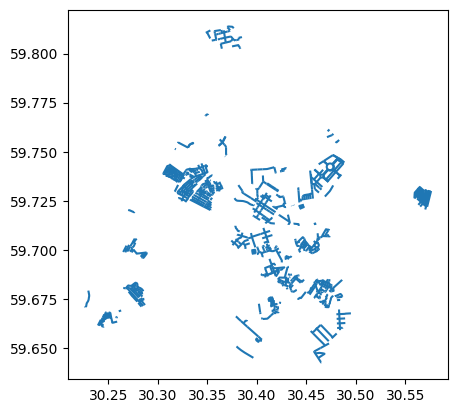

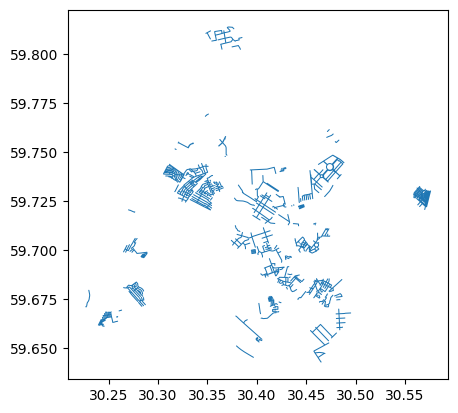

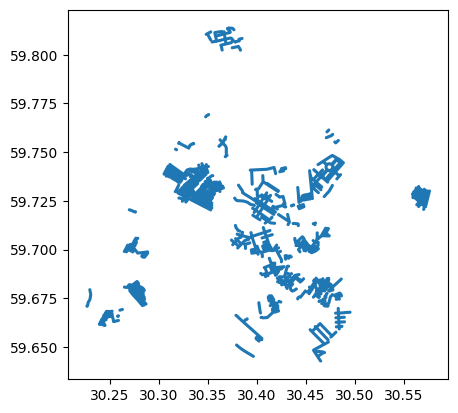

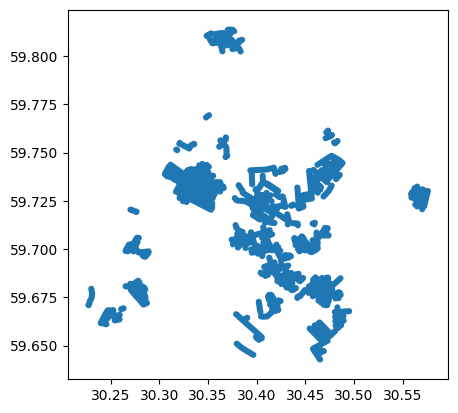

In [146]:
roads_cat1.plot()
buffered_cat1_30.plot()
buffered_cat1_60.plot()
buffered_cat1_90.plot()

<Axes: >

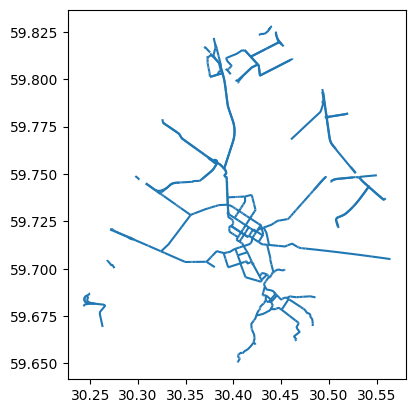

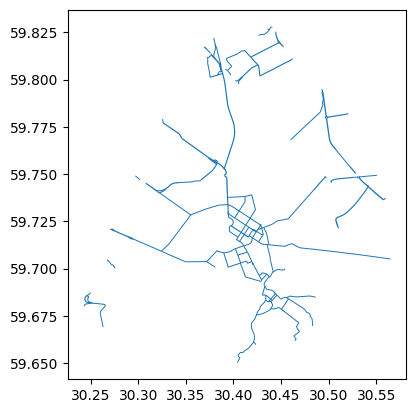

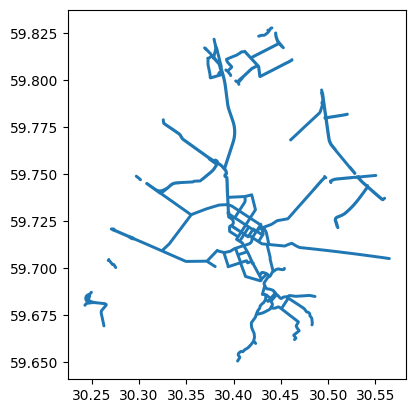

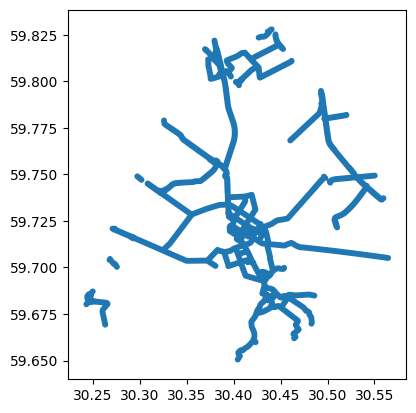

In [147]:
roads_cat2.plot()
buffered_cat2_30.plot()
buffered_cat2_60.plot()
buffered_cat2_90.plot()

<Axes: >

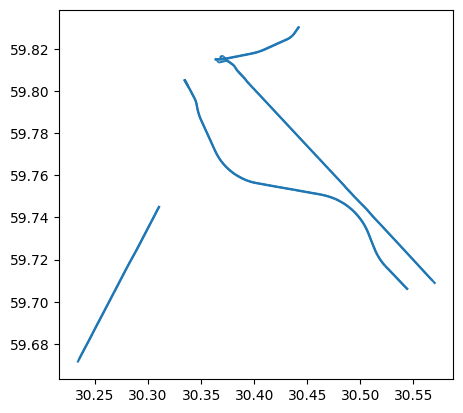

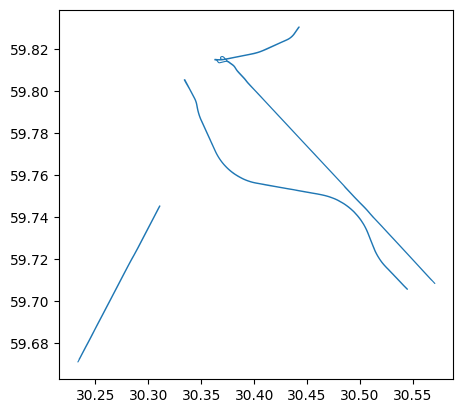

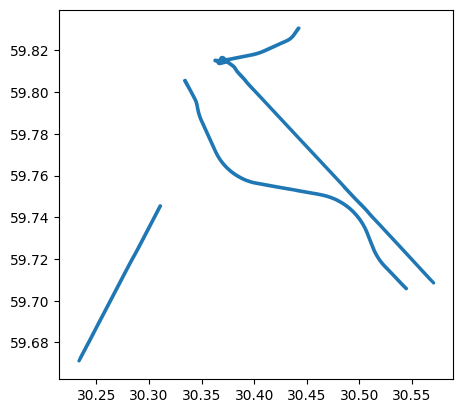

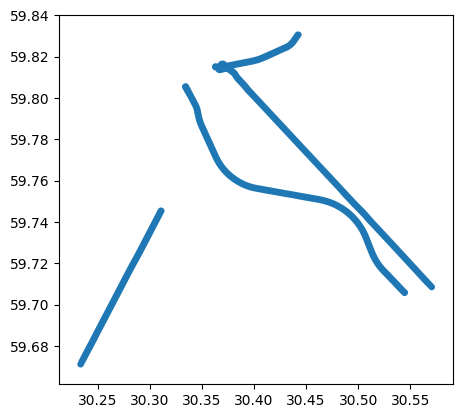

In [148]:
roads_cat3.plot()
buffered_cat3_30.plot()
buffered_cat3_60.plot()
buffered_cat3_90.plot()

<Axes: >

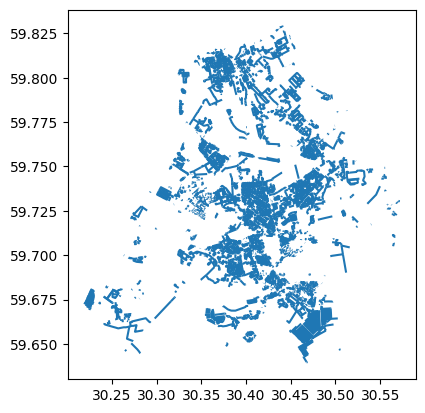

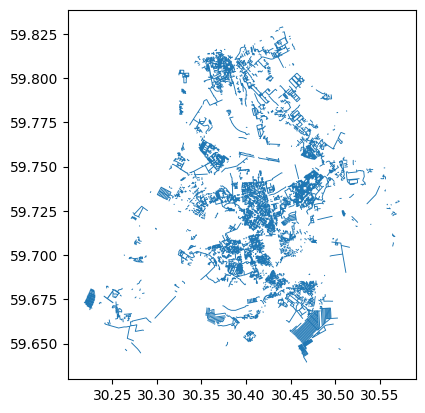

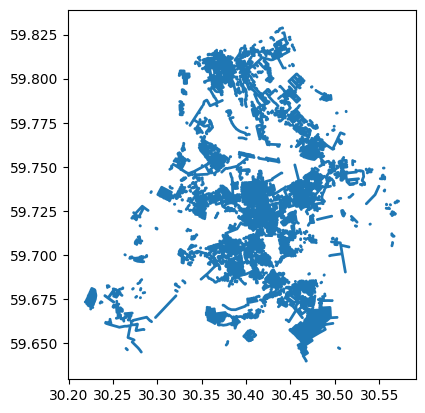

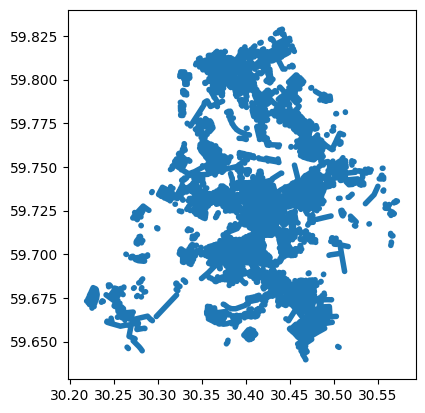

In [149]:
roads_cat4.plot()
buffered_cat4_30.plot()
buffered_cat4_60.plot()
buffered_cat4_90.plot()

In [150]:
def join_buildings(buffer_category, roads_category):
    buffered_category = {
        'cat1_30': buffered_cat1_30,
        'cat1_60': buffered_cat1_60,
        'cat1_90': buffered_cat1_90,
        'cat2_30': buffered_cat2_30,
        'cat2_60': buffered_cat2_60,
        'cat2_90': buffered_cat2_90,
        'cat3_30': buffered_cat3_30,
        'cat3_60': buffered_cat3_60,
        'cat3_90': buffered_cat3_90,
        'cat4_30': buffered_cat4_30,
        'cat4_60': buffered_cat4_60,
        'cat4_90': buffered_cat4_90,

    }.get(buffer_category)

    joined = buildings_gdf.sjoin(buffered_category, how='left')
    #joined = buildings_gdf.sjoin(buffered_category, how="left", predicate='intersects')
    joined.rename(columns={'index_right': 'index_roads'}, inplace=True)
    #joined.drop_duplicates(subset='id_left',inplace=True)
    if roads_category:
        joined['buffered_highway'] = \
            joined['buffered_highway'].apply(lambda x: 'not_residential' if pd.isnull(x) else x)
    else:
        joined['buffered_highway'] = \
            joined['buffered_highway'].apply(lambda x: 'residential' if pd.isnull(x) else x)

    joined.reset_index(inplace=True, drop=True)

    return joined

In [151]:
buffer_categories = ['cat1_30', 'cat1_60', 'cat1_90','cat2_30','cat2_60','cat2_90',\
                    'cat3_30', 'cat3_60', 'cat3_90','cat4_30','cat4_60','cat4_90']
roads_category = 1                      # 1 is residential, 0 is ['primary', 'secondary','tertiary']
joined_buildings1 = join_buildings(buffer_categories[0],roads_category)
joined_buildings2 = join_buildings(buffer_categories[1],roads_category)
joined_buildings3 = join_buildings(buffer_categories[2],roads_category)
roads_category = 0
joined_buildings4 = join_buildings(buffer_categories[3],roads_category)
joined_buildings5 = join_buildings(buffer_categories[4],roads_category)
joined_buildings6 = join_buildings(buffer_categories[5],roads_category)
joined_buildings7 = join_buildings(buffer_categories[6],roads_category)
joined_buildings8 = join_buildings(buffer_categories[7],roads_category)
joined_buildings9 = join_buildings(buffer_categories[8],roads_category)
joined_buildings10 = join_buildings(buffer_categories[9],roads_category)
joined_buildings11 = join_buildings(buffer_categories[10],roads_category)
joined_buildings12 = join_buildings(buffer_categories[11],roads_category)

In [152]:
print(joined_buildings1.shape)
print(joined_buildings2.shape)
print(joined_buildings3.shape)
print(joined_buildings4.shape)
print(joined_buildings5.shape)
print(joined_buildings6.shape)
print(joined_buildings7.shape)
print(joined_buildings8.shape)
print(joined_buildings9.shape)
print(joined_buildings10.shape)
print(joined_buildings11.shape)
print(joined_buildings12.shape)

(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)
(21280, 16)


In [153]:
joined_buildings1.groupby('official_type').count()

,id_left,building,geometry,all_tag_keys,all_tags,index_landuse,landuse,land_building,index_official,name,addr_stree,addr_house,index_roads,id_right,buffered_highway
official_type,,,,,,,,,,,,,,,
NON_RES,16013,16013,16013,16013,16013,13802,16013,16013,16013,416,3669,3551,4972,4972,16013
RES,5267,5267,5267,5267,5267,5158,5267,5267,5267,38,4921,4001,2993,2993,5267


In [154]:
joined_buildings1.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       not_residential     11041     11041     11041         11041   
              residential          4972      4972      4972          4972   
RES           not_residential      2274      2274      2274          2274   
              residential          2993      2993      2993          2993   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       not_residential      11041           9260    11041   
              residential           4972           4542     4972   
RES           not_residential       2274           2217     2274   
              residential           2993           2941     2993   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       not_residential           11041           11041   325   
              residential                4972            4972    91   
RES           not_residential            2274            2274    19   
              residential                2993            2993    19   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       not_residential         2248        2155            0         0  
              residential             1421        1396         4972      4972  
RES           not_residential         2062        1265            0         0  
              residential             2859        2736         2993      2993

In [268]:
joined_buildings1[(joined_buildings1['land_building'] == 'commercial')\
               &(joined_buildings1['buffered_highway'] == 'residential')].shape

(9, 16)

In [156]:
joined_buildings2.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       not_residential      6923      6923      6923          6923   
              residential          9090      9090      9090          9090   
RES           not_residential      1171      1171      1171          1171   
              residential          4096      4096      4096          4096   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       not_residential       6923           5573     6923   
              residential           9090           8229     9090   
RES           not_residential       1171           1144     1171   
              residential           4096           4014     4096   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       not_residential            6923            6923   238   
              residential                9090            9090   178   
RES           not_residential            1171            1171     8   
              residential                4096            4096    30   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       not_residential         1392        1355            0         0  
              residential             2277        2196         9090      9090  
RES           not_residential         1033         493            0         0  
              residential             3888        3508         4096      4096

In [157]:
joined_buildings3.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       not_residential      4593      4593      4593          4593   
              residential         11420     11420     11420         11420   
RES           not_residential       553       553       553           553   
              residential          4714      4714      4714          4714   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       not_residential       4593           3624     4593   
              residential          11420          10178    11420   
RES           not_residential        553            540      553   
              residential           4714           4618     4714   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       not_residential            4593            4593   173   
              residential               11420           11420   243   
RES           not_residential             553             553     3   
              residential                4714            4714    35   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       not_residential          894         844            0         0  
              residential             2775        2707        11420     11420  
RES           not_residential          468         191            0         0  
              residential             4453        3810         4714      4714

In [158]:
joined_buildings4.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       non_res_road          917       917       917           917   
              residential         15096     15096     15096         15096   
RES           non_res_road          436       436       436           436   
              residential          4831      4831      4831          4831   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       non_res_road           917            653      917   
              residential          15096          13149    15096   
RES           non_res_road           436            413      436   
              residential           4831           4745     4831   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       non_res_road                917             917    76   
              residential               15096           15096   340   
RES           non_res_road                436             436    20   
              residential                4831            4831    18   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       non_res_road             427         424          917       917  
              residential             3242        3127            0         0  
RES           non_res_road             426         426          436       436  
              residential             4495        3575            0         0

In [159]:
joined_buildings5.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       non_res_road         3464      3464      3464          3464   
              residential         12549     12549     12549         12549   
RES           non_res_road         1024      1024      1024          1024   
              residential          4243      4243      4243          4243   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       non_res_road          3464           2777     3464   
              residential          12549          11025    12549   
RES           non_res_road          1024            974     1024   
              residential           4243           4184     4243   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       non_res_road               3464            3464   191   
              residential               12549           12549   225   
RES           non_res_road               1024            1024    28   
              residential                4243            4243    10   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       non_res_road            1239        1235         3464      3464  
              residential             2430        2316            0         0  
RES           non_res_road             985         979         1024      1024  
              residential             3936        3022            0         0

In [160]:
joined_buildings6.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       non_res_road         5796      5796      5796          5796   
              residential         10217     10217     10217         10217   
RES           non_res_road         1717      1717      1717          1717   
              residential          3550      3550      3550          3550   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       non_res_road          5796           4797     5796   
              residential          10217           9005    10217   
RES           non_res_road          1717           1649     1717   
              residential           3550           3509     3550   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       non_res_road               5796            5796   263   
              residential               10217           10217   153   
RES           non_res_road               1717            1717    35   
              residential                3550            3550     3   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       non_res_road            1912        1916         5796      5796  
              residential             1757        1635            0         0  
RES           non_res_road            1625        1586         1717      1717  
              residential             3296        2415            0         0

In [161]:
joined_buildings7.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       residential         15972     15972     15972         15972   
              roads_cat3             41        41        41            41   
RES           residential          5267      5267      5267          5267   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       residential          15972          13792    15972   
              roads_cat3              41             10       41   
RES           residential           5267           5158     5267   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       residential               15972           15972   411   
              roads_cat3                   41              41     5   
RES           residential                5267            5267    38   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       residential             3666        3548            0         0  
              roads_cat3                 3           3           41        41  
RES           residential             4921        4001            0         0

In [162]:
joined_buildings8.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       residential         15774     15774     15774         15774   
              roads_cat3            239       239       239           239   
RES           residential          5257      5257      5257          5257   
              roads_cat3             10        10        10            10   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       residential          15774          13639    15774   
              roads_cat3             239            163      239   
RES           residential           5257           5149     5257   
              roads_cat3              10              9       10   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       residential               15774           15774   387   
              roads_cat3                  239             239    29   
RES           residential                5257            5257    38   
              roads_cat3                   10              10     0   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       residential             3616        3491            0         0  
              roads_cat3                53          60          239       239  
RES           residential             4913        3992            0         0  
              roads_cat3                 8           9           10        10

In [163]:
joined_buildings9.groupby(['official_type','buffered_highway']).count()

id_left  building  geometry  all_tag_keys  \
official_type buffered_highway                                              
NON_RES       residential         15580     15580     15580         15580   
              roads_cat3            433       433       433           433   
RES           residential          5231      5231      5231          5231   
              roads_cat3             36        36        36            36   

                                all_tags  index_landuse  landuse  \
official_type buffered_highway                                     
NON_RES       residential          15580          13465    15580   
              roads_cat3             433            337      433   
RES           residential           5231           5123     5231   
              roads_cat3              36             35       36   

                                land_building  index_official  name  \
official_type buffered_highway                                        
NON_RES       residential               15580           15580   375   
              roads_cat3                  433             433    41   
RES           residential                5231            5231    38   
              roads_cat3                   36              36     0   

                                addr_stree  addr_house  index_roads  id_right  
official_type buffered_highway                                                 
NON_RES       residential             3567        3433            0         0  
              roads_cat3               102         118          433       433  
RES           residential             4894        3968            0         0  
              roads_cat3                27          33           36        36

In [164]:
len(areahandler.osm_data)

21281

In [165]:
keys_list = []
for sublist in areahandler.osm_data:
    keys_list.append(sublist[3])

In [166]:
keys_list_flat = [val for sublist in keys_list for val in sublist]

In [167]:
unique_keys = sorted(list(set(keys_list_flat)))

In [168]:
unique_keys

['abandoned',
 'abandoned:building',
 'access',
 'addr2:housenumber',
 'addr2:street',
 'addr:city',
 'addr:country',
 'addr:district',
 'addr:full',
 'addr:hamlet',
 'addr:housename',
 'addr:housenumber',
 'addr:letter',
 'addr:place',
 'addr:postcode',
 'addr:region',
 'addr:street',
 'addr:street2',
 'addr:suburb',
 'addr:suburb:rgis',
 'addr:unit',
 'aeroway',
 'air_conditioning',
 'alt_name',
 'alt_name:1',
 'alt_name:2',
 'alt_name:3',
 'alt_name:4',
 'alt_name:de',
 'alt_name:en',
 'alt_name:fr',
 'alt_name:ja',
 'alt_name:ru',
 'alt_name:uk',
 'alt_name:zh',
 'amenity',
 'architect',
 'architect:en',
 'architect:it',
 'area',
 'artist_name',
 'atm',
 'automated',
 'barrier',
 'barrier:personnel',
 'bath:tub',
 'bath:type',
 'beds',
 'bench',
 'bin',
 'branch',
 'brand',
 'brand:en',
 'brand:ru',
 'brand:wikidata',
 'brand:wikipedia',
 'breakfast',
 'building',
 'building:architecture',
 'building:cladding',
 'building:colour',
 'building:developer',
 'building:facade:material',

In [169]:
key_freq = []
for key in unique_keys:
    key_freq.append(keys_list_flat.count(key))

In [170]:
len(key_freq)

307

In [171]:
keys_tuples = list(zip(unique_keys, key_freq))
keys_freq_df = pd.DataFrame(keys_tuples, columns = ['Key', 'Freq'])

In [172]:
keys_freq_df.sort_values(by=['Freq'], inplace=True, ascending=False)

In [173]:
keys_freq_df.reset_index(inplace=True, drop=True)

In [174]:
keys_freq_df.head()

,Key,Freq
0,building,21281
1,addr:street,8600
2,addr:housenumber,7560
3,addr:city,6463
4,building:levels,5841


In [175]:
keys_freq_df.sort_values(by=['Key'], inplace=False, ascending=True).head(20)

,Key,Freq
40,abandoned,100
306,abandoned:building,1
14,access,453
168,addr2:housenumber,3
110,addr2:street,13
3,addr:city,6463
21,addr:country,256
156,addr:district,5
239,addr:full,1
240,addr:hamlet,1


In [176]:
keys_freq_df.head(21)

,Key,Freq
0,building,21281
1,addr:street,8600
2,addr:housenumber,7560
3,addr:city,6463
4,building:levels,5841
5,roof:shape,2646
6,addr:suburb,1486
7,roof:levels,937
8,addr:postcode,830
9,height,714


In [177]:
selected_tags = ['source','addr:street','name','building:levels',\
                'roof:shape','amenity','brand','website','shop']
num_keys = len(selected_tags)+2

In [178]:
len(selected_tags)

9

In [179]:
def preprocess_data(input_data, value_tags, selected_tags):
    col_pos = 2
    for tag_key in selected_tags:
        col_name = tag_key
        input_data.insert(col_pos,col_name,0)
        input_data[col_name] = input_data.apply(lambda x: 1 if tag_key in list(x['all_tag_keys']) \
            else 0, axis=1)

    for tag_key in value_tags:
        input_data[tag_key] = input_data.apply(lambda x: x['all_tags'].get(tag_key) \
            if tag_key in list(x['all_tag_keys']) else 0, axis=1)

    # fix anomalies in FFX County data
    input_data.drop(input_data[(input_data['building:levels'] == 'K-6')].index, inplace=True)
    input_data.loc[(input_data['building:levels'] == '-1,1,2,3'),'building:levels']=4

    input_data.drop(columns=['all_tag_keys', 'all_tags'], inplace=True)

    input_data['official_type'] = \
    input_data['official_type'].apply(lambda x: 1 if x == 'RES' else 0)

    return input_data

In [180]:
def add_buffers(input_data,col_names, buffers_list):
    for num in range(0, len(col_names)):
        input_data.insert(num+2,col_names[num],buffers_list[num])
        input_data[col_names[num]] = input_data[col_names[num]].apply(lambda x: 1 if x == 'residential' else 0)

    return input_data

In [181]:
#num_buffers = 6
#buffer_loc = 0
#value_tags = ['roof:shape','building:levels']
#col_names = ['buffer_cat1_30','buffer_cat1_60','buffer_cat1_90',\
#            'buffer_cat2_30','buffer_cat2_60','buffer_cat2_90']
#buffers_list = [joined_buildings1['buffered_highway'],joined_buildings2['buffered_highway'],\
#                joined_buildings3['buffered_highway'],joined_buildings4['buffered_highway'],\
#                joined_buildings5['buffered_highway'],joined_buildings6['buffered_highway']]

num_buffers = 12
buffer_loc = 0
value_tags = ['roof:shape','building:levels']
col_names = ['buffer_cat1_30','buffer_cat1_60','buffer_cat1_90',\
            'buffer_cat2_30','buffer_cat2_60','buffer_cat2_90',\
            'buffer_cat3_30','buffer_cat3_60','buffer_cat3_90',\
            'buffer_cat4_30','buffer_cat4_60','buffer_cat4_90']
buffers_list = [joined_buildings1['buffered_highway'],joined_buildings2['buffered_highway'],\
                joined_buildings3['buffered_highway'],joined_buildings4['buffered_highway'],\
                joined_buildings5['buffered_highway'],joined_buildings6['buffered_highway'],\
                joined_buildings7['buffered_highway'],joined_buildings8['buffered_highway'],\
                joined_buildings9['buffered_highway'],joined_buildings10['buffered_highway'],\
                joined_buildings11['buffered_highway'],joined_buildings12['buffered_highway']]
backup_data = joined_buildings1.copy()
#input_data = input_data[['geometry','official_type','land_building','all_tag_keys','all_tags']]
#input_data = input_data[['geometry','official_type','building','landuse','all_tag_keys','all_tags']]
#input_data = input_data[['geometry','official_type','building','landuse',\
#                        'all_tag_keys','all_tags','id_left']]
#input_data = input_data[['geometry','official_type','building','landuse','amenity_key','parking_area',\
#                        'all_tag_keys','all_tags']]
backup_data = backup_data[['geometry','official_type','building','landuse','land_building',\
                        'all_tag_keys','all_tags','id_left']]
backup_data.insert(len(backup_data.columns), 'area',backup_data['geometry'].to_crs(epsg=32610).area)
backup_data = preprocess_data(backup_data,value_tags,selected_tags)

backup_data = add_buffers(backup_data,col_names[buffer_loc:buffer_loc+num_buffers],\
                         buffers_list[buffer_loc:buffer_loc+num_buffers])

In [182]:
len(areahandler.amenity_data)

1109

In [183]:
# transform the list of roads into a pandas DataFrame
amenity_colnames = ['amenity_key', 'geometry']
amenity_df = pd.DataFrame(areahandler.amenity_data, columns=amenity_colnames)

In [184]:
amenity_df.head()

,amenity_key,geometry
0,fuel,"POLYGON ((30.4514239 59.7315336, 30.4514462 59..."
1,hospital,"POLYGON ((30.4184702 59.7184525, 30.4186923 59..."
2,parking,"POLYGON ((30.3976537 59.7994382, 30.3978163 59..."
3,place_of_worship,"POLYGON ((30.3809301 59.7074697, 30.3811237 59..."
4,fuel,"POLYGON ((30.4934777 59.7478744, 30.4937039 59..."


In [185]:
amenity_df.shape

(1109, 2)

In [186]:
amenity_categories = amenity_df.groupby(['amenity_key'])['geometry'].count().reset_index(name="count")

In [187]:
amenity_categories.tail(50)

,amenity_key,count
0,arts_centre,4
1,bench,1
2,bicycle_parking,1
3,bicycle_rental,2
4,boat_rental,2
5,cafe,21
6,car_wash,19
7,checkpoint,3
8,clinic,1
9,college,3


In [188]:
parking_df = amenity_df[(amenity_df['amenity_key'] == 'parking') | (amenity_df['amenity_key'] == 'parking_space')]

In [189]:
parking_df = parking_df.assign(amenity_key='parking')

In [190]:
parking_df.reset_index(inplace=True, drop=True)

In [191]:
parking_df.shape

(696, 2)

In [192]:
parking_gdf = geopandas.GeoDataFrame(parking_df.copy(),crs="EPSG:4326",geometry='geometry')

In [193]:
parking_gdf.insert(len(parking_gdf.columns), 'parking_area',parking_gdf['geometry'].to_crs(epsg=32610).area)

In [194]:
parking_gdf.head()

,amenity_key,geometry,parking_area
0,parking,"POLYGON ((30.39765 59.79944, 30.39782 59.79935...",17329.974670
1,parking,"POLYGON ((30.37816 59.70889, 30.37831 59.70872...",1022.083335
2,parking,"POLYGON ((30.35611 59.72783, 30.35621 59.72771...",327.485507
3,parking,"POLYGON ((30.40197 59.72712, 30.40247 59.72696...",927.581119
4,parking,"POLYGON ((30.41785 59.74233, 30.41789 59.74225...",4411.553131


In [195]:
parking_gdf.shape

(696, 3)

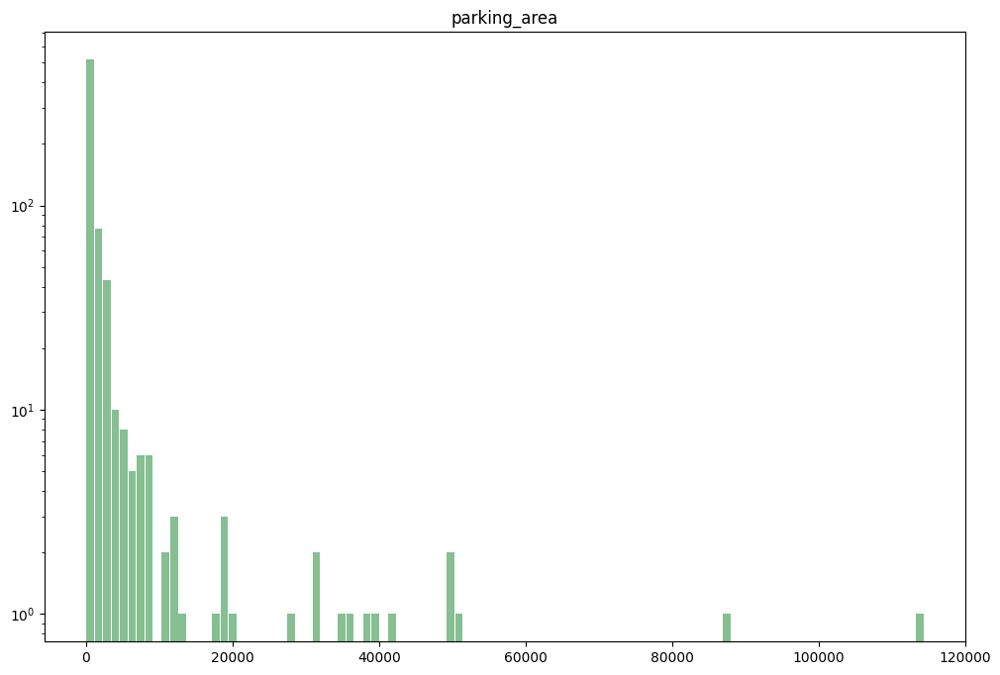

In [196]:
hist = parking_gdf.hist(bins=100, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)
plt.yscale('log')

In [197]:
breaks = jenkspy.jenks_breaks(parking_gdf['parking_area'],3) # ,nb_class=3
print(breaks)

[np.float64(10.917897683172662), np.float64(13174.436201620123), np.float64(51153.72474254846), np.float64(114400.06445435096)]


In [198]:
bins_list = ['bin1','bin2','bin3']
parking_gdf['cut_jenks'] = pd.cut(parking_gdf['parking_area'],
                                bins=breaks,
                                labels=bins_list,
                                include_lowest=True)

In [199]:
parking_gdf.head()

,amenity_key,geometry,parking_area,cut_jenks
0,parking,"POLYGON ((30.39765 59.79944, 30.39782 59.79935...",17329.974670,bin2
1,parking,"POLYGON ((30.37816 59.70889, 30.37831 59.70872...",1022.083335,bin1
2,parking,"POLYGON ((30.35611 59.72783, 30.35621 59.72771...",327.485507,bin1
3,parking,"POLYGON ((30.40197 59.72712, 30.40247 59.72696...",927.581119,bin1
4,parking,"POLYGON ((30.41785 59.74233, 30.41789 59.74225...",4411.553131,bin1


In [200]:
for bin in bins_list:
    parking_gdf[bin] = 0
   # parking_gdf.insert(len(parking_gdf.columns),bin,0)
    parking_gdf[bin] = parking_gdf.apply(lambda x: 1 if x['cut_jenks'] == bin
                                     else 0, axis=1)

In [201]:
parking_gdf.head()

,amenity_key,geometry,parking_area,cut_jenks,bin1,bin2,bin3
0,parking,"POLYGON ((30.39765 59.79944, 30.39782 59.79935...",17329.974670,bin2,0,1,0
1,parking,"POLYGON ((30.37816 59.70889, 30.37831 59.70872...",1022.083335,bin1,1,0,0
2,parking,"POLYGON ((30.35611 59.72783, 30.35621 59.72771...",327.485507,bin1,1,0,0
3,parking,"POLYGON ((30.40197 59.72712, 30.40247 59.72696...",927.581119,bin1,1,0,0
4,parking,"POLYGON ((30.41785 59.74233, 30.41789 59.74225...",4411.553131,bin1,1,0,0


In [202]:
backup_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'roof:shape', 'building:levels', 'name', 'addr:street',
       'source', 'building', 'landuse', 'land_building', 'id_left', 'area'],
      dtype='object')

In [203]:
radius_list = [30,60,90]
counter = 1
for bin in bins_list:
    for radius in radius_list:
        parking_buffer = parking_gdf.copy()
        parking_buffer = parking_buffer[['geometry',bin]]
        col_name = 'parking_cat'+str(counter)
        counter += 1
        parking_buffer.rename(columns={bin: col_name}, inplace=True)
        parking_buffer['geometry'] = parking_buffer['geometry'].to_crs(epsg=32636).buffer(radius)
        parking_buffer.to_crs(epsg=4326, inplace=True)
        buildings_parking = backup_data.sjoin(parking_buffer, how="left", predicate='intersects')
        buildings_parking[col_name] = buildings_parking[col_name].fillna(0)
        buildings_parking.drop_duplicates(subset='id_left',inplace=True)
        buildings_parking.reset_index(inplace=True, drop=True)
        backup_data.insert(len(backup_data.columns),col_name,list(buildings_parking[col_name]))

/tmp/ipython-input-203-2757118471.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  parking_buffer.rename(columns={bin: col_name}, inplace=True)
/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [204]:
backup_data.drop(columns=['id_left'], inplace=True)

In [205]:
backup_data.shape

(21280, 36)

In [206]:
backup_data.head()

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
0,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...",1,0,0,1,1,1,1,1,1,...,960.310132,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...",1,0,1,1,1,1,1,1,1,...,1203.790947,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...",1,0,0,1,1,1,1,1,1,...,911.332595,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...",1,0,0,0,0,0,0,1,1,...,1305.350409,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...",0,0,0,0,1,1,1,1,1,...,2331.360427,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [207]:
backup_data.loc[(backup_data['building:levels'] == '1;3;2'),'building:levels']=3
backup_data.loc[(backup_data['building:levels'] == '4 floors'),'building:levels']=4

In [208]:
input_data = backup_data.copy()

In [209]:
input_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'roof:shape', 'building:levels', 'name', 'addr:street',
       'source', 'building', 'landuse', 'land_building', 'area',
       'parking_cat1', 'parking_cat2', 'parking_cat3', 'parking_cat4',
       'parking_cat5', 'parking_cat6', 'parking_cat7', 'parking_cat8',
       'parking_cat9'],
      dtype='object')

In [210]:
input_data.drop(columns=['land_building', 'roof:shape'], inplace=True)

In [211]:
input_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'building:levels', 'name', 'addr:street', 'source',
       'building', 'landuse', 'area', 'parking_cat1', 'parking_cat2',
       'parking_cat3', 'parking_cat4', 'parking_cat5', 'parking_cat6',
       'parking_cat7', 'parking_cat8', 'parking_cat9'],
      dtype='object')

In [212]:
input_data.groupby('landuse').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(50)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
landuse,,,,,,,,,,,,,,,,,,,,,
residential,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687,...,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687
allotments,5486,5486,5486,5486,5486,5486,5486,5486,5486,5486,...,5486,5486,5486,5486,5486,5486,5486,5486,5486,5486
no_landuse,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320,...,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320
non_res,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836,...,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836
military,418,418,418,418,418,418,418,418,418,418,...,418,418,418,418,418,418,418,418,418,418
garages,249,249,249,249,249,249,249,249,249,249,...,249,249,249,249,249,249,249,249,249,249
construction,137,137,137,137,137,137,137,137,137,137,...,137,137,137,137,137,137,137,137,137,137
farmyard,26,26,26,26,26,26,26,26,26,26,...,26,26,26,26,26,26,26,26,26,26
farmland,25,25,25,25,25,25,25,25,25,25,...,25,25,25,25,25,25,25,25,25,25


In [213]:
input_data['landuse'].unique()

array(['residential', 'construction', 'no_landuse', 'non_res',
       'religious', 'garages', 'military', 'cemetery', 'depot',
       'brownfield', 'allotments', 'orchard', 'meadow', 'farmyard',
       'farmland', 'natural_reserve', 'forest', 'vineyard'], dtype=object)

In [214]:
input_data.shape

(21280, 34)

In [215]:
input_data.groupby('building').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(20)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
building,,,,,,,,,,,,,,,,,,,,,
yes,13575,13575,13575,13575,13575,13575,13575,13575,13575,13575,...,13575,13575,13575,13575,13575,13575,13575,13575,13575,13575
house,2633,2633,2633,2633,2633,2633,2633,2633,2633,2633,...,2633,2633,2633,2633,2633,2633,2633,2633,2633,2633
apartments,1297,1297,1297,1297,1297,1297,1297,1297,1297,1297,...,1297,1297,1297,1297,1297,1297,1297,1297,1297,1297
detached,765,765,765,765,765,765,765,765,765,765,...,765,765,765,765,765,765,765,765,765,765
greenhouse,536,536,536,536,536,536,536,536,536,536,...,536,536,536,536,536,536,536,536,536,536
service,374,374,374,374,374,374,374,374,374,374,...,374,374,374,374,374,374,374,374,374,374
semidetached_house,302,302,302,302,302,302,302,302,302,302,...,302,302,302,302,302,302,302,302,302,302
garage,210,210,210,210,210,210,210,210,210,210,...,210,210,210,210,210,210,210,210,210,210
garages,204,204,204,204,204,204,204,204,204,204,...,204,204,204,204,204,204,204,204,204,204


In [216]:
#input_data.to_pickle("./Vasily_Input_Data/Vasily.pkl")

In [217]:
#type(input_data['building'].unique())

In [218]:
#test_array = np.array(['a','b','c','dormitory', 'office', 'yes', 'university'], dtype=object)

In [219]:
#test_array

In [220]:
#a = np.array([1, 2, 3, 2, 4, 1,9])
#b = np.array([3, 4, 5, 6,7,8])
#np.setxor1d(a, b)

In [221]:
input_data['building'].unique()

array(['apartments', 'yes', 'dormitory', 'retail', 'residential',
       'office', 'kindergarten', 'school', 'commercial', 'industrial',
       'tower', 'palace', 'service', 'university', 'house', 'hospital',
       'policlinic', 'hotel', 'church', 'government', 'mansion',
       'toilets', 'chapel', 'public', 'greenhouse', 'store',
       'construction', 'garages', 'bunker', 'ruins', 'kiosk', 'college',
       'detached', 'garage', 'community_centre', 'roof', 'hangar',
       'train_station', 'manufacture', 'warehouse', 'stable',
       'semidetached_house', 'shed', 'bell_tower', 'civic', 'fuel',
       'terrace', 'water_tower', 'collapsed', 'castle', 'guardhouse',
       'no', 'temple', 'pavilion', 'farm_auxiliary', 'parking', 'bridge',
       'cathedral', 'bath', 'carport', 'storage_tank', 'container',
       'triumphal_arch', 'fire_station', 'clinic', 'gate', 'marquee',
       'allotment_house', 'gazebo', 'tent', 'sports_centre', 'grandstand',
       'static_caravan', 'museum'], dt

In [222]:
common_features = np.array(['apartments', 'church', 'civic', 'commercial', 'construction',
       'detached', 'dormitory', 'garage', 'garages', 'greenhouse',
       'hospital', 'hotel', 'house', 'industrial', 'kindergarten',
       'office', 'parking', 'public', 'residential', 'retail', 'roof',
       'school', 'semidetached_house', 'service', 'shed',
       'static_caravan', 'terrace', 'warehouse', 'yes'], dtype=object)

In [223]:
unique_buildings = np.setxor1d(input_data['building'].unique(), common_features).tolist()

In [224]:
unique_buildings

['allotment_house',
 'bath',
 'bell_tower',
 'bridge',
 'bunker',
 'carport',
 'castle',
 'cathedral',
 'chapel',
 'clinic',
 'collapsed',
 'college',
 'community_centre',
 'container',
 'farm_auxiliary',
 'fire_station',
 'fuel',
 'gate',
 'gazebo',
 'government',
 'grandstand',
 'guardhouse',
 'hangar',
 'kiosk',
 'mansion',
 'manufacture',
 'marquee',
 'museum',
 'no',
 'palace',
 'pavilion',
 'policlinic',
 'ruins',
 'sports_centre',
 'stable',
 'storage_tank',
 'store',
 'temple',
 'tent',
 'toilets',
 'tower',
 'train_station',
 'triumphal_arch',
 'university',
 'water_tower']

In [225]:
len(unique_buildings)

45

In [226]:
input_data[input_data['building'].isin(unique_buildings)].shape

(385, 34)

In [227]:
input_data['building'] = input_data['building'].apply(\
                                lambda x: 'misc_buildings' if x in(unique_buildings)
                                                else x)

In [228]:
input_data[input_data['building'].isin(unique_buildings)].shape

(0, 34)

In [229]:
input_data.shape

(21280, 34)

In [230]:
input_data.groupby('building').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(50)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
building,,,,,,,,,,,,,,,,,,,,,
yes,13575,13575,13575,13575,13575,13575,13575,13575,13575,13575,...,13575,13575,13575,13575,13575,13575,13575,13575,13575,13575
house,2633,2633,2633,2633,2633,2633,2633,2633,2633,2633,...,2633,2633,2633,2633,2633,2633,2633,2633,2633,2633
apartments,1297,1297,1297,1297,1297,1297,1297,1297,1297,1297,...,1297,1297,1297,1297,1297,1297,1297,1297,1297,1297
detached,765,765,765,765,765,765,765,765,765,765,...,765,765,765,765,765,765,765,765,765,765
greenhouse,536,536,536,536,536,536,536,536,536,536,...,536,536,536,536,536,536,536,536,536,536
misc_buildings,385,385,385,385,385,385,385,385,385,385,...,385,385,385,385,385,385,385,385,385,385
service,374,374,374,374,374,374,374,374,374,374,...,374,374,374,374,374,374,374,374,374,374
semidetached_house,302,302,302,302,302,302,302,302,302,302,...,302,302,302,302,302,302,302,302,302,302
garage,210,210,210,210,210,210,210,210,210,210,...,210,210,210,210,210,210,210,210,210,210


In [231]:
common_landuse = np.array(['non_res', 'no_landuse', 'residential', 'construction',
       'forest', 'recreation_ground', 'cemetery', 'farmyard'], dtype=object)

In [232]:
unique_landuse = np.setxor1d(input_data['landuse'].unique(), common_landuse).tolist()

In [233]:
unique_landuse

['allotments',
 'brownfield',
 'depot',
 'farmland',
 'garages',
 'meadow',
 'military',
 'natural_reserve',
 'orchard',
 'recreation_ground',
 'religious',
 'vineyard']

In [234]:
input_data[input_data['landuse'].isin(unique_landuse)].shape

(6246, 34)

In [235]:
input_data['landuse'] = input_data['landuse'].apply(\
                                lambda x: 'misc_landuse' if x in(unique_landuse)
                                                else x)

In [236]:
input_data[input_data['landuse'].isin(unique_landuse)].shape

(0, 34)

In [237]:
input_data.groupby('landuse').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(50)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
landuse,,,,,,,,,,,,,,,,,,,,,
residential,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687,...,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687
misc_landuse,6246,6246,6246,6246,6246,6246,6246,6246,6246,6246,...,6246,6246,6246,6246,6246,6246,6246,6246,6246,6246
no_landuse,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320,...,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320
non_res,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836,...,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836
construction,137,137,137,137,137,137,137,137,137,137,...,137,137,137,137,137,137,137,137,137,137
farmyard,26,26,26,26,26,26,26,26,26,26,...,26,26,26,26,26,26,26,26,26,26
cemetery,25,25,25,25,25,25,25,25,25,25,...,25,25,25,25,25,25,25,25,25,25
forest,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3


In [238]:
input_data['landuse'].replace(['residential','non_res','forest','cemetery','recreation_ground',\
                                'construction','farmyard'],['residential_landuse','non_res_landuse',\
                                'forest_landuse','cemetery_landuse','recreation_ground_landuse',\
                                'construction_landuse','farmyard_landuse'], inplace=True)

/tmp/ipython-input-238-2676512996.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  input_data['landuse'].replace(['residential','non_res','forest','cemetery','recreation_ground',\


In [239]:
input_data.groupby('landuse').count().sort_values(by=['geometry'], inplace=False, ascending=False).head(50)

,geometry,official_type,buffer_cat1_30,buffer_cat1_60,buffer_cat1_90,buffer_cat2_30,buffer_cat2_60,buffer_cat2_90,buffer_cat3_30,buffer_cat3_60,...,area,parking_cat1,parking_cat2,parking_cat3,parking_cat4,parking_cat5,parking_cat6,parking_cat7,parking_cat8,parking_cat9
landuse,,,,,,,,,,,,,,,,,,,,,
residential_landuse,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687,...,10687,10687,10687,10687,10687,10687,10687,10687,10687,10687
misc_landuse,6246,6246,6246,6246,6246,6246,6246,6246,6246,6246,...,6246,6246,6246,6246,6246,6246,6246,6246,6246,6246
no_landuse,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320,...,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320
non_res_landuse,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836,...,1836,1836,1836,1836,1836,1836,1836,1836,1836,1836
construction_landuse,137,137,137,137,137,137,137,137,137,137,...,137,137,137,137,137,137,137,137,137,137
farmyard_landuse,26,26,26,26,26,26,26,26,26,26,...,26,26,26,26,26,26,26,26,26,26
cemetery_landuse,25,25,25,25,25,25,25,25,25,25,...,25,25,25,25,25,25,25,25,25,25
forest_landuse,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3


In [240]:
input_data.shape

(21280, 34)

In [241]:
Vasily_baseline = input_data.copy()

In [242]:
Vasily_baseline.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'building:levels', 'name', 'addr:street', 'source',
       'building', 'landuse', 'area', 'parking_cat1', 'parking_cat2',
       'parking_cat3', 'parking_cat4', 'parking_cat5', 'parking_cat6',
       'parking_cat7', 'parking_cat8', 'parking_cat9'],
      dtype='object')

In [243]:
Vasily_baseline = Vasily_baseline[['geometry', 'official_type', 'building']]

In [244]:
Vasily_baseline.columns

Index(['geometry', 'official_type', 'building'], dtype='object')

In [245]:
Vasily_baseline.head()

,geometry,official_type,building
0,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...",1,apartments
1,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...",1,apartments
2,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...",1,apartments
3,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...",1,apartments
4,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...",0,yes


In [246]:
residential_list = ['residential','apartments','dormitory', 'house','semidetached_house']
Vasily_baseline['building'] = Vasily_baseline['building'].apply(\
                                lambda x: 'residential' if x in(residential_list)
                                                else x)

In [247]:
non_residential_list = ['public','commercial','industrial', 'school','church','office',
                        'retail','hotel','warehouse','kindergarten','civic','hospital']
Vasily_baseline['building'] = Vasily_baseline['building'].apply(\
                                lambda x: 'non_residential' if x in(non_residential_list)
                                                else x)

In [248]:
unknown_list = ['yes','detached','terrace', 'garage','roof','shed',
                'parking','garages','greenhouse','static_caravan','service','construction',
                'misc_buildings']
Vasily_baseline['building'] = Vasily_baseline['building'].apply(\
                                lambda x: 'unknown' if x in(unknown_list)
                                                else x)

In [249]:
Vasily_baseline.head()

,geometry,official_type,building
0,"POLYGON ((30.46898 59.75973, 30.46915 59.75966...",1,residential
1,"POLYGON ((30.47006 59.76038, 30.47132 59.75985...",1,residential
2,"POLYGON ((30.46917 59.75636, 30.47013 59.75595...",1,residential
3,"POLYGON ((30.41314 59.73801, 30.4132 59.73789,...",1,residential
4,"POLYGON ((30.38568 59.71801, 30.38583 59.71796...",0,unknown


In [250]:
Vasily_baseline.groupby('building').count()

,geometry,official_type
building,,
non_residential,553,553
residential,4330,4330
unknown,16397,16397


In [251]:
Vasily_baseline.groupby(['official_type','building']).count()

geometry
official_type building                 
0             non_residential       549
              residential            23
              unknown             15441
1             non_residential         4
              residential          4307
              unknown               956

In [252]:
import os
os.makedirs("/content/Vasily_baseline", exist_ok=True)

In [253]:
# Vasily_baseline.to_file( "Vasily_baselinee") # "./Vasily_baseline/Vasily_baseline.shp"

In [254]:
Vasily_baseline.groupby('official_type').count()

,geometry,building
official_type,,
0,16013,16013
1,5267,5267


In [255]:
import pandas as pd
from sklearn import preprocessing

def nominal_transform(input_data, value_tags):
    for tag in value_tags:
        if tag in input_data.columns:
            ohe = preprocessing.OneHotEncoder(sparse_output=False, handle_unknown='ignore')
            ohe_results = ohe.fit_transform(input_data[[tag]].astype(str))
            # FIX: Using get_feature_names_out() to generate unique column names
            # (e.g., 'building_garages', 'landuse_garages')
            new_feature_names = ohe.get_feature_names_out([tag])

            # FIX: Explicitly using input_data.index to ensure correct alignment
            # (no need for reset_index)
            df_ohe = pd.DataFrame(ohe_results, columns=new_feature_names, index=input_data.index)

            input_data.drop(columns=[tag], inplace=True)
            input_data = pd.concat([input_data, df_ohe], axis=1)
        else:
            print(f"Warning: Column '{tag}' not found in the DataFrame. Skipping one-hot encoding for '{tag}'.")

    return input_data

In [256]:
def nominal_transform(input_data, value_tags):
    ohe = preprocessing.OneHotEncoder(sparse_output = False)
    for tag in value_tags:
        ohe_results = ohe.fit_transform(input_data[[tag]])
        input_data.reset_index(inplace=True, drop=True)
        input_data = pd.concat([input_data, \
            pd.DataFrame(ohe_results, columns=ohe.categories_[0].tolist())], axis=1)
        input_data.drop(columns=[tag], inplace=True)

    return input_data

In [257]:
# nominal transform

#value_tags = ['roof:shape','building','landuse']
#value_tags = ['roof:shape','land_building']
#value_tags = ['roof:shape','building']
value_tags = ['building','landuse']
nominal_data = input_data.copy()
#nominal_data['roof:shape'] = nominal_data['roof:shape'].astype(str)
nominal_data = nominal_transform(nominal_data, value_tags)
nominal_features = list(nominal_data.columns[2:])
nominal_features

['buffer_cat1_30',
 'buffer_cat1_60',
 'buffer_cat1_90',
 'buffer_cat2_30',
 'buffer_cat2_60',
 'buffer_cat2_90',
 'buffer_cat3_30',
 'buffer_cat3_60',
 'buffer_cat3_90',
 'buffer_cat4_30',
 'buffer_cat4_60',
 'buffer_cat4_90',
 'shop',
 'website',
 'brand',
 'amenity',
 'building:levels',
 'name',
 'addr:street',
 'source',
 'area',
 'parking_cat1',
 'parking_cat2',
 'parking_cat3',
 'parking_cat4',
 'parking_cat5',
 'parking_cat6',
 'parking_cat7',
 'parking_cat8',
 'parking_cat9',
 'apartments',
 'church',
 'civic',
 'commercial',
 'construction',
 'detached',
 'dormitory',
 'garage',
 'garages',
 'greenhouse',
 'hospital',
 'hotel',
 'house',
 'industrial',
 'kindergarten',
 'misc_buildings',
 'office',
 'parking',
 'public',
 'residential',
 'retail',
 'roof',
 'school',
 'semidetached_house',
 'service',
 'shed',
 'static_caravan',
 'terrace',
 'warehouse',
 'yes',
 'cemetery_landuse',
 'construction_landuse',
 'farmyard_landuse',
 'forest_landuse',
 'misc_landuse',
 'no_landuse'

In [258]:
nominal_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'building:levels', 'name', 'addr:street', 'source', 'area',
       'parking_cat1', 'parking_cat2', 'parking_cat3', 'parking_cat4',
       'parking_cat5', 'parking_cat6', 'parking_cat7', 'parking_cat8',
       'parking_cat9', 'apartments', 'church', 'civic', 'commercial',
       'construction', 'detached', 'dormitory', 'garage', 'garages',
       'greenhouse', 'hospital', 'hotel', 'house', 'industrial',
       'kindergarten', 'misc_buildings', 'office', 'parking', 'public',
       'residential', 'retail', 'roof', 'school', 'semidetached_house',
       'service', 'shed', 'static_caravan', 'terrace', 'warehouse', 'yes',
       'cemetery_landuse', 'construction_landuse', 'farm

In [259]:
sorted(nominal_data.columns)

['addr:street',
 'amenity',
 'apartments',
 'area',
 'brand',
 'buffer_cat1_30',
 'buffer_cat1_60',
 'buffer_cat1_90',
 'buffer_cat2_30',
 'buffer_cat2_60',
 'buffer_cat2_90',
 'buffer_cat3_30',
 'buffer_cat3_60',
 'buffer_cat3_90',
 'buffer_cat4_30',
 'buffer_cat4_60',
 'buffer_cat4_90',
 'building:levels',
 'cemetery_landuse',
 'church',
 'civic',
 'commercial',
 'construction',
 'construction_landuse',
 'detached',
 'dormitory',
 'farmyard_landuse',
 'forest_landuse',
 'garage',
 'garages',
 'geometry',
 'greenhouse',
 'hospital',
 'hotel',
 'house',
 'industrial',
 'kindergarten',
 'misc_buildings',
 'misc_landuse',
 'name',
 'no_landuse',
 'non_res_landuse',
 'office',
 'official_type',
 'parking',
 'parking_cat1',
 'parking_cat2',
 'parking_cat3',
 'parking_cat4',
 'parking_cat5',
 'parking_cat6',
 'parking_cat7',
 'parking_cat8',
 'parking_cat9',
 'public',
 'residential',
 'residential_landuse',
 'retail',
 'roof',
 'school',
 'semidetached_house',
 'service',
 'shed',
 'shop',

In [260]:
import numpy as np

nominal_data['building:levels'] = pd.to_numeric(nominal_data['building:levels'], errors='coerce')

median_levels = nominal_data['building:levels'].median()
nominal_data['building:levels'].fillna(median_levels, inplace=True)
print(f"Filled NaN values in 'building:levels' with median: {median_levels}")



X = nominal_data[nominal_features]
y = nominal_data["official_type"]
weights = {0:2.0, 1:1.0}

Filled NaN values in 'building:levels' with median: 0.0


/tmp/ipython-input-260-2655044279.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  nominal_data['building:levels'].fillna(median_levels, inplace=True)


Confusion matrix:
[[3195    8]
 [  15 1038]]


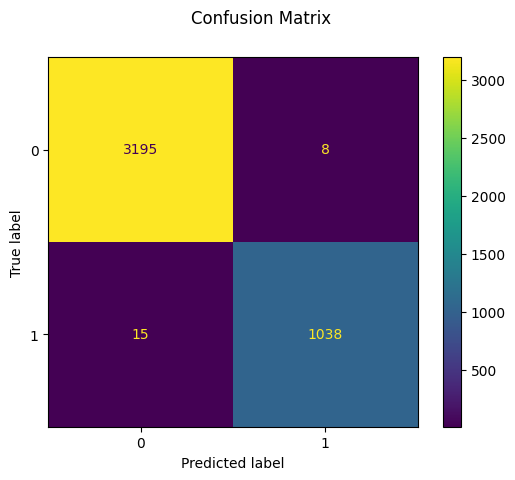

Classification report for classifier DecisionTreeClassifier(class_weight={0: 2.0, 1: 1.0},
                       min_impurity_decrease=0.0001, min_samples_split=20,
                       random_state=0):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3203
           1       0.99      0.99      0.99      1053

    accuracy                           0.99      4256
   macro avg       0.99      0.99      0.99      4256
weighted avg       0.99      0.99      0.99      4256




In [261]:
# latest, building and landuse

X = nominal_data[nominal_features]
y = nominal_data["official_type"]
weights = {0:2.0, 1:1.0}

# Split data into 80% train and 20% test subsets
X_train, X_test, y_train, y_test = train_test_split(\
    X, y, test_size=0.2, shuffle=True, stratify=y)
dt_split = DecisionTreeClassifier(class_weight=weights,min_samples_split=20, \
                                random_state=0,min_impurity_decrease = 0.0001)

#dt_split = DecisionTreeClassifier(min_samples_split=20, random_state=0,min_impurity_decrease = 0.0001)

# Learn on the train subset
dt_split.fit(X_train, y_train)

# Predict the target on the test subset
predicted = dt_split.predict(X_test)

# 1 = RES; 0 = NON_RES

disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, predicted)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

print(
    f"Classification report for classifier {dt_split}:\n"
    f"{metrics.classification_report(y_test, predicted)}\n"
)

In [262]:
print(y.value_counts())

official_type
0    16013
1     5267
Name: count, dtype: int64


Confusion matrix:
[[15951    62]
 [  161  5106]]


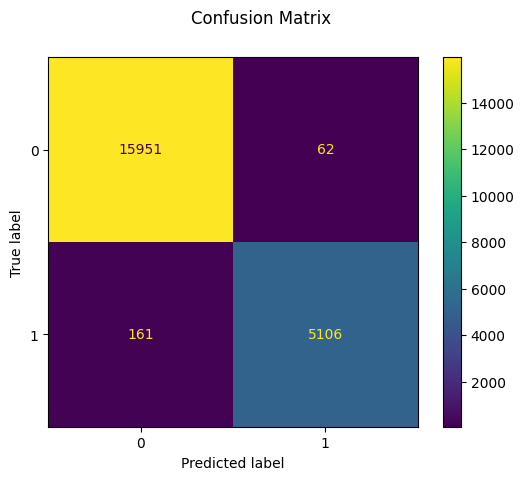

Classification report for classifier DecisionTreeClassifier(class_weight={0: 2.0, 1: 1.0},
                       min_impurity_decrease=0.0001, min_samples_split=20,
                       random_state=0):
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     16013
           1       0.99      0.97      0.98      5267

    accuracy                           0.99     21280
   macro avg       0.99      0.98      0.99     21280
weighted avg       0.99      0.99      0.99     21280




In [263]:
# result for generating output shape file

X = nominal_data[nominal_features]
y = nominal_data["official_type"]
#weights = 'balanced'
weights = {0:2.0, 1:1.0}
dt = DecisionTreeClassifier(class_weight=weights,min_samples_split=20, random_state=0,min_impurity_decrease = 0.0001)
y_pred = cross_val_predict(dt, X, y, cv=10)
disp = metrics.ConfusionMatrixDisplay.from_predictions(y, y_pred)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

print(
    f"Classification report for classifier {dt}:\n"
    f"{metrics.classification_report(y, y_pred)}\n"
)

In [264]:
output_data = nominal_data.copy()
output_data.drop(columns=['official_type','buffer_cat2_30', 'buffer_cat2_60','buffer_cat2_90'], inplace=True)
output_data.insert(1,'official',y)
output_data.insert(2,'predicted',y_pred)
output_filtered = output_data.copy()
#output_filtered = output_filtered[output_filtered['official'] != output_filtered['predicted']]
output_filtered['official'] = \
    output_filtered['official'].apply(lambda x: 'RES' if x == 1 else 'NON_RES')
output_filtered['predicted'] = \
    output_filtered['predicted'].apply(lambda x: 'RES' if x == 1 else 'NON_RES')

<Axes: >

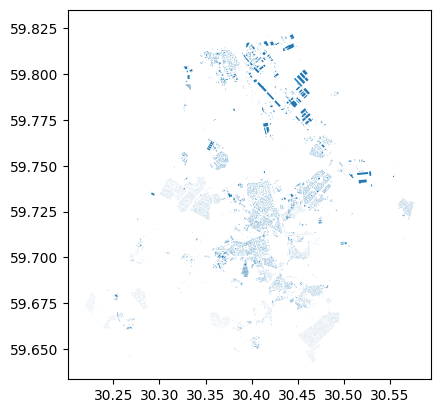

In [265]:
output_data.plot()

<Axes: >

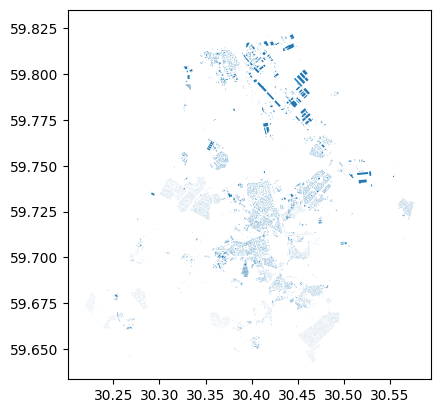

In [266]:
output_filtered.plot()

In [271]:
#output_filtered.to_file("./Datasets/OSM/Geopandas_Output/filtered_output.shp")
#output_data.to_file("./Vasily_Predictions/Vasily_Predictions.shp")

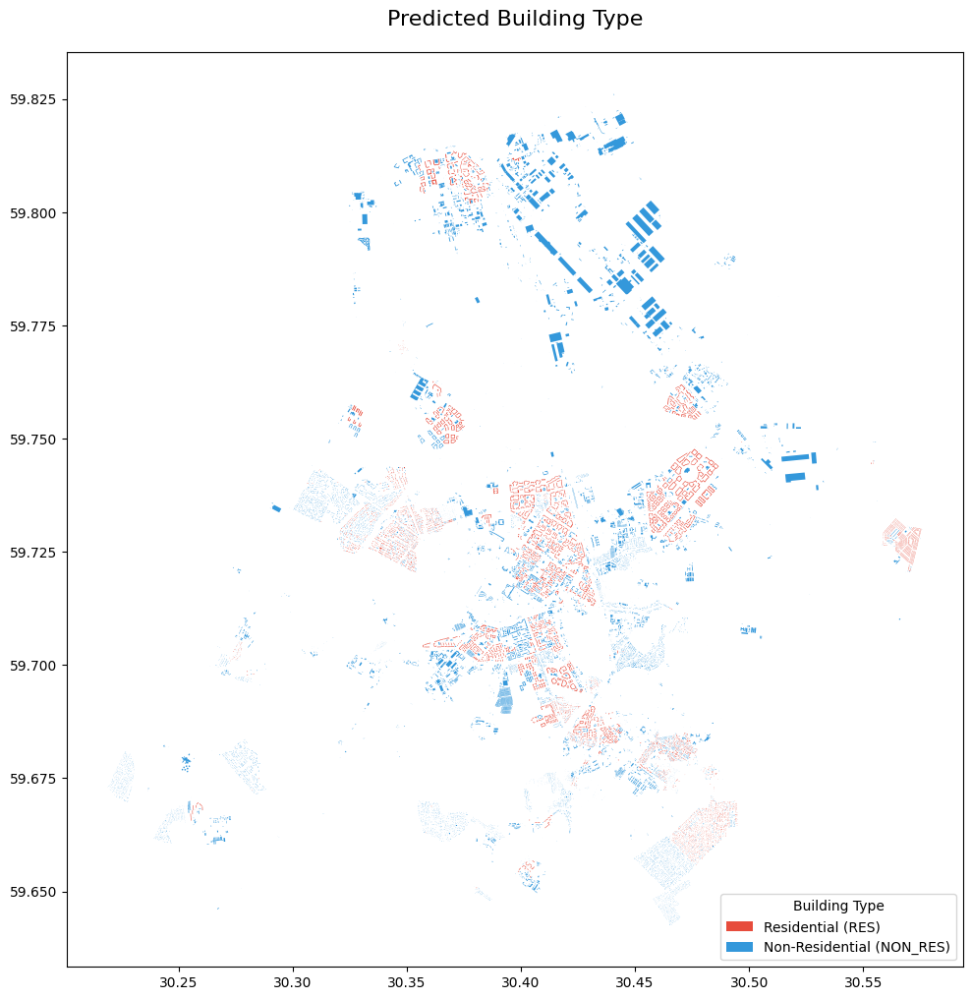

In [269]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Define distinct colors for each category
color_mapping = {
    'RES': '#e74c3c' ,   # Red for non-residential
    'NON_RES': '#3498db' # Blue for residential
}

# Create a list of colors for each feature based on its category
colors = [color_mapping[cat] for cat in output_filtered['predicted']]

# Create the plot
ax = output_filtered.plot(color=colors, figsize=(10, 15))

# Create custom legend handles
legend_handles = [
    Patch(facecolor=color_mapping['RES'], label='Residential (RES)'),
    Patch(facecolor=color_mapping['NON_RES'], label='Non-Residential (NON_RES)')
]

# Add custom legend
ax.legend(handles=legend_handles, loc='lower right', title='Building Type', frameon=True)

# Add title
plt.title('Predicted Building Type', fontsize=16, pad=20)
plt.tight_layout()
plt.show()

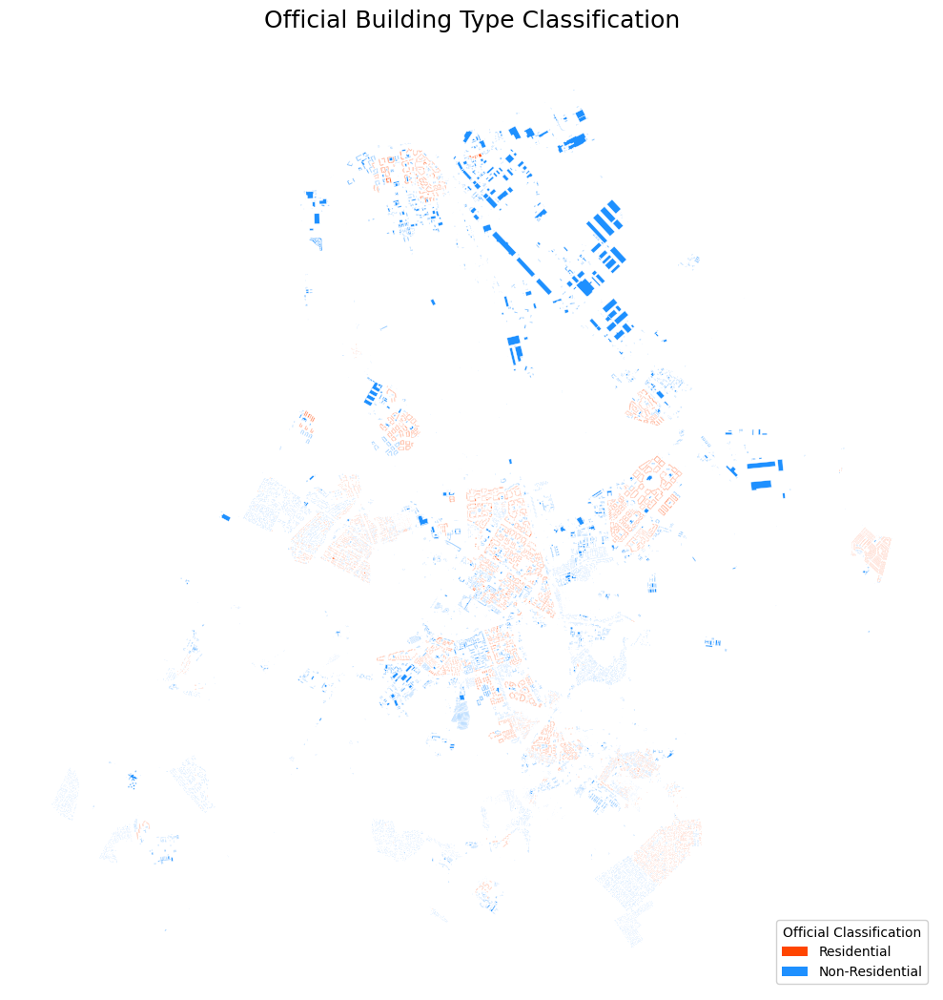

In [270]:
# More distinctive colors
vibrant_colors = {
    'RES': '#FF4500',  # Orange-red for residential
    'NON_RES': '#1E90FF'  # Dodger blue for non-residential
}

# Create color list
colors = [vibrant_colors[cat] for cat in output_filtered['official']]

# Plot with enhanced styling
ax = output_filtered.plot(color=colors, figsize=(10, 15), linewidth=0.3, edgecolor='white')

# Add legend and title
legend = [
    Patch(facecolor=vibrant_colors['RES'], label='Residential'),
    Patch(facecolor=vibrant_colors['NON_RES'], label='Non-Residential')
]
ax.legend(handles=legend, title='Official Classification',
          loc='lower right', framealpha=0.9)

plt.title('Official Building Type Classification', fontsize=18, pad=15)
plt.axis('off')  # Cleaner look without axes
plt.tight_layout()
plt.show()

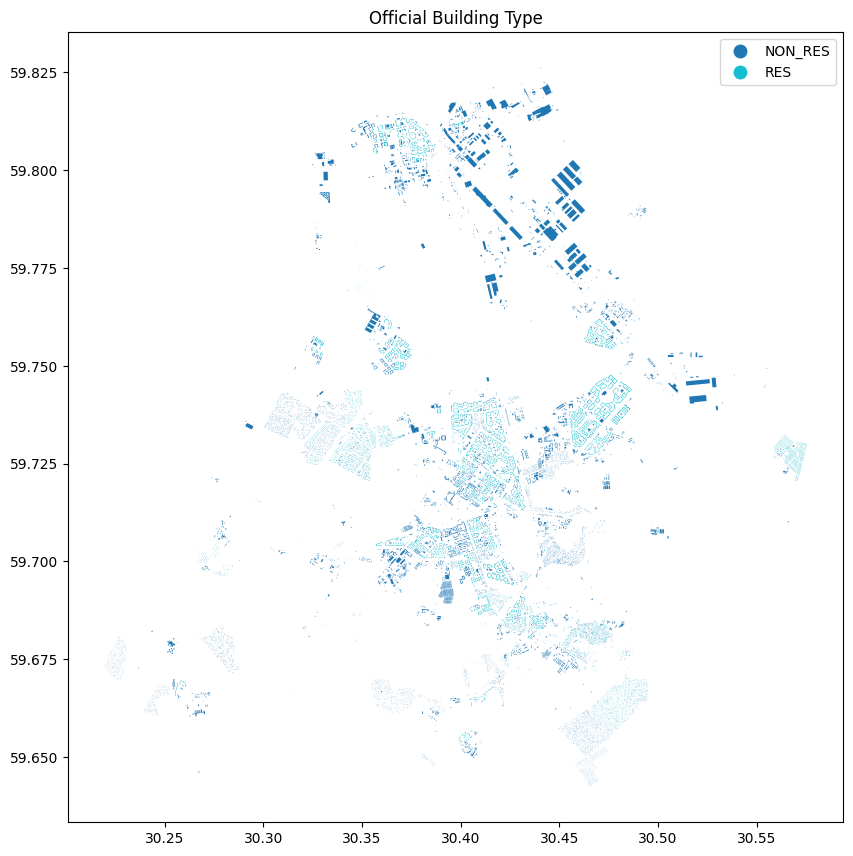

In [272]:
output_filtered.plot(column='official', legend=True, figsize=(10, 15))
plt.title('Official Building Type')
plt.show()


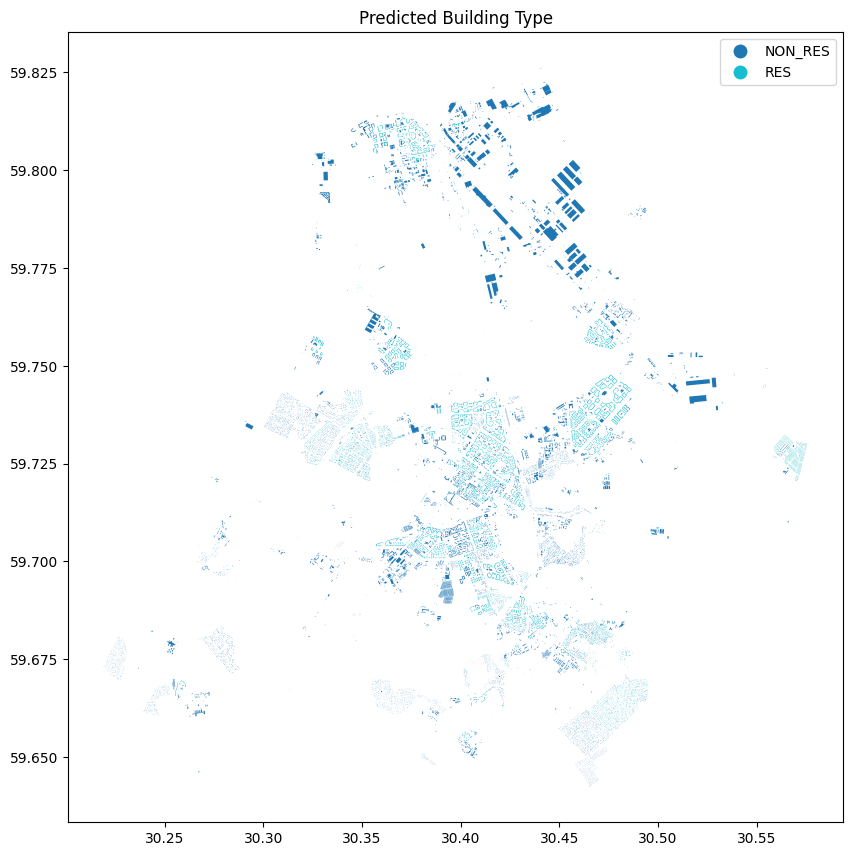

In [273]:
output_filtered.plot(column='predicted', legend=True, figsize=(10, 15))
plt.title('Predicted Building Type')
plt.show()

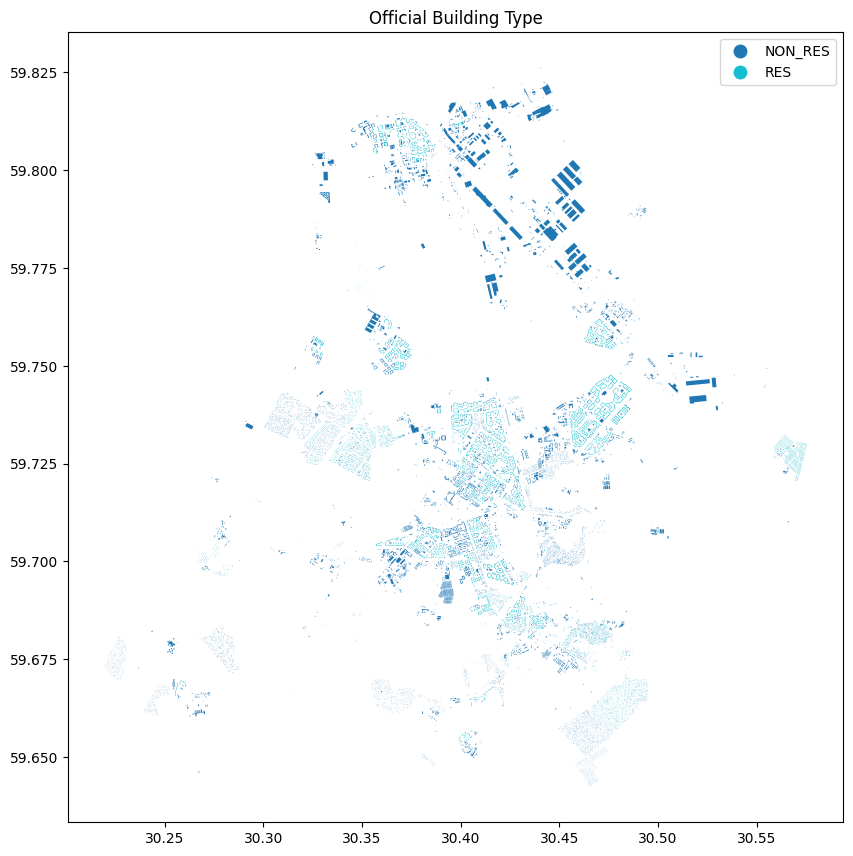

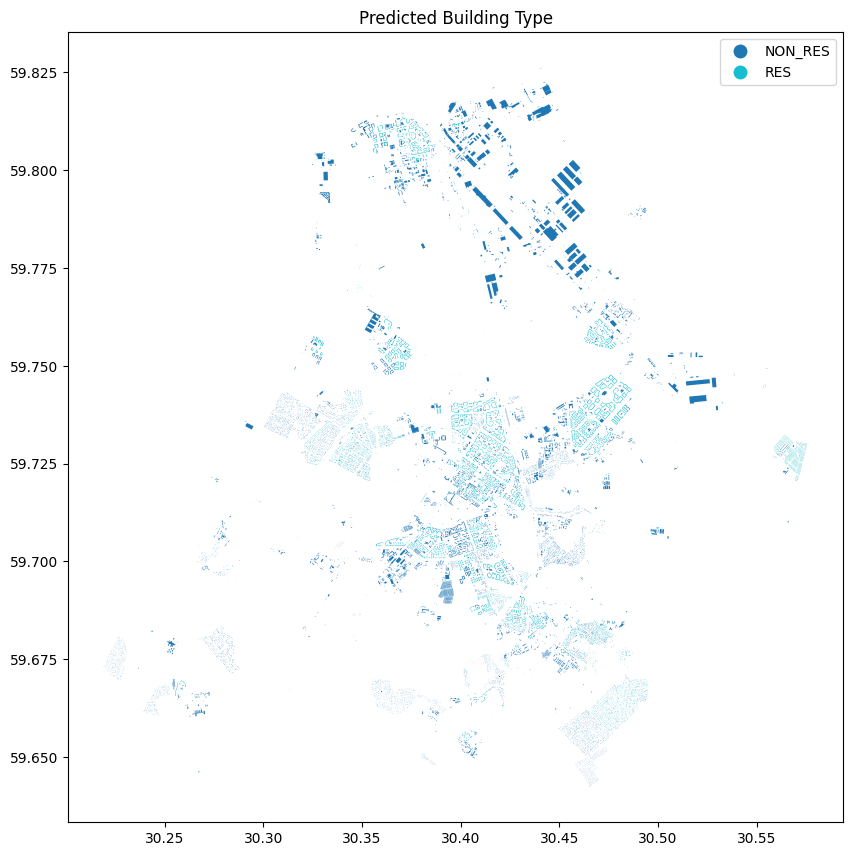

In [274]:
output_filtered.plot(column='official', legend=True, figsize=(10, 15))
plt.title('Official Building Type')
plt.show()

output_filtered.plot(column='predicted', legend=True, figsize=(10, 15))
plt.title('Predicted Building Type')
plt.show()

output_filtered['match'] = (output_filtered['official'] == output_filtered['predicted'])
# output_filtered.explore(column='match', tiles='cartodbdarkmatter', legend=True, cmap='viridis', popup=['official','predicted', 'match'])

In [ ]:
# Ablation Study

In [276]:
input_data.columns

Index(['geometry', 'official_type', 'buffer_cat1_30', 'buffer_cat1_60',
       'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',
       'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',
       'buffer_cat4_60', 'buffer_cat4_90', 'shop', 'website', 'brand',
       'amenity', 'building:levels', 'name', 'addr:street', 'source',
       'building', 'landuse', 'area', 'parking_cat1', 'parking_cat2',
       'parking_cat3', 'parking_cat4', 'parking_cat5', 'parking_cat6',
       'parking_cat7', 'parking_cat8', 'parking_cat9'],
      dtype='object')

In [277]:
ablation_data = input_data.copy()

In [278]:
ablation_data.drop(columns=['buffer_cat1_30', 'buffer_cat1_60',\
                        'buffer_cat1_90', 'buffer_cat2_30', 'buffer_cat2_60', 'buffer_cat2_90',\
                        'buffer_cat3_30', 'buffer_cat3_60', 'buffer_cat3_90', 'buffer_cat4_30',\
                        'buffer_cat4_60', 'buffer_cat4_90',\
                        \
                        \
                        'parking_cat1', 'parking_cat2', 'parking_cat3', 'parking_cat4',\
                        'parking_cat5', 'parking_cat6', 'parking_cat7', 'parking_cat8',\
                        'parking_cat9'], inplace=True)

In [279]:
ablation_data.columns

Index(['geometry', 'official_type', 'shop', 'website', 'brand', 'amenity',
       'building:levels', 'name', 'addr:street', 'source', 'building',
       'landuse', 'area'],
      dtype='object')

In [280]:
# nominal transform

value_tags = ['building','landuse']
#nominal_data = input_data.copy()
#value_tags = ['building']
ablation_data = nominal_transform(ablation_data, value_tags)
ablation_features = list(ablation_data.columns[2:])
ablation_features

['shop',
 'website',
 'brand',
 'amenity',
 'building:levels',
 'name',
 'addr:street',
 'source',
 'area',
 'apartments',
 'church',
 'civic',
 'commercial',
 'construction',
 'detached',
 'dormitory',
 'garage',
 'garages',
 'greenhouse',
 'hospital',
 'hotel',
 'house',
 'industrial',
 'kindergarten',
 'misc_buildings',
 'office',
 'parking',
 'public',
 'residential',
 'retail',
 'roof',
 'school',
 'semidetached_house',
 'service',
 'shed',
 'static_caravan',
 'terrace',
 'warehouse',
 'yes',
 'cemetery_landuse',
 'construction_landuse',
 'farmyard_landuse',
 'forest_landuse',
 'misc_landuse',
 'no_landuse',
 'non_res_landuse',
 'residential_landuse']

In [281]:
ablation_data.columns

Index(['geometry', 'official_type', 'shop', 'website', 'brand', 'amenity',
       'building:levels', 'name', 'addr:street', 'source', 'area',
       'apartments', 'church', 'civic', 'commercial', 'construction',
       'detached', 'dormitory', 'garage', 'garages', 'greenhouse', 'hospital',
       'hotel', 'house', 'industrial', 'kindergarten', 'misc_buildings',
       'office', 'parking', 'public', 'residential', 'retail', 'roof',
       'school', 'semidetached_house', 'service', 'shed', 'static_caravan',
       'terrace', 'warehouse', 'yes', 'cemetery_landuse',
       'construction_landuse', 'farmyard_landuse', 'forest_landuse',
       'misc_landuse', 'no_landuse', 'non_res_landuse', 'residential_landuse'],
      dtype='object')

In [282]:
ablation_data.shape

(21280, 49)


Applying cleaning to 'building:levels' in ablation_data...
Filled NaN values in ablation_data['building:levels'] with median: 0.0
Confusion matrix:
[[3190    7]
 [  16 1043]]


/tmp/ipython-input-283-2401569229.py:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ablation_data['building:levels'].fillna(median_levels, inplace=True)


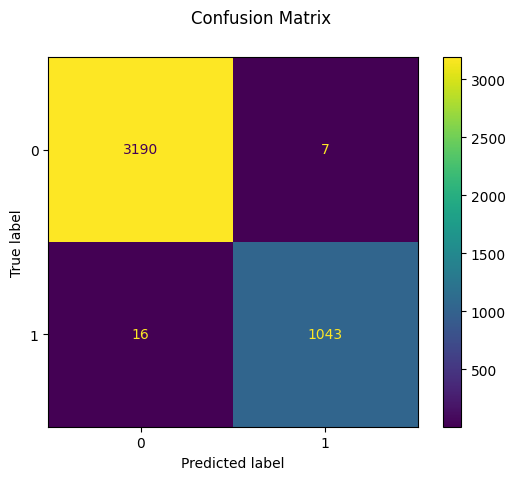

Classification report for classifier DecisionTreeClassifier(class_weight={0: 2.0, 1: 1.0},
                       min_impurity_decrease=0.0001, min_samples_split=20,
                       random_state=0):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3197
           1       0.99      0.98      0.99      1059

    accuracy                           0.99      4256
   macro avg       0.99      0.99      0.99      4256
weighted avg       0.99      0.99      0.99      4256




In [283]:
import pandas as pd
import numpy as np # Ensure numpy is imported
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
import matplotlib.pyplot as plt

# Assume 'ablation_data' and 'ablation_features' are defined earlier in your code.
# For example, ablation_data might be loaded from a file or created through other processing.

# --- Clean 'building:levels' in ablation_data ---
# This step is crucial to ensure all data is numeric before training.
if 'building:levels' in ablation_data.columns:
    print("\nApplying cleaning to 'building:levels' in ablation_data...")
    # Convert 'building:levels' to numeric, coercing any errors (like '7;4;4') to NaN.
    ablation_data['building:levels'] = pd.to_numeric(ablation_data['building:levels'], errors='coerce')

    # Fill the NaN values with the median of the column.
    # The median is a robust choice for numerical features like counts.
    median_levels = ablation_data['building:levels'].median()
    ablation_data['building:levels'].fillna(median_levels, inplace=True)
    print(f"Filled NaN values in ablation_data['building:levels'] with median: {median_levels}")
else:
    print("\n'building:levels' column not found in ablation_data. Skipping cleaning for this column.")

# --- End of cleaning step ---


# Data Selection
X = ablation_data[ablation_features]
y = ablation_data["official_type"]
weights = {0:2.0, 1:1.0}

# Split data into 80% train and 20% test subsets
X_train, X_test, y_train, y_test = train_test_split(\
    X, y, test_size=0.2, shuffle=True)

# Decision Tree Classifier Initialization
dt_split = DecisionTreeClassifier(class_weight=weights,min_samples_split=20, \
                                random_state=0,min_impurity_decrease = 0.0001)

# Learn on the train subset
dt_split.fit(X_train, y_train)

# Predict the target on the test subset
predicted = dt_split.predict(X_test)

# 1 = RES; 0 = NON_RES (Class Labels)

# Display Confusion Matrix
disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, predicted)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

# Display Classification Report
print(
    f"Classification report for classifier {dt_split}:\n"
    f"{metrics.classification_report(y_test, predicted)}\n"
)

Confusion matrix:
[[3217    8]
 [  14 1017]]


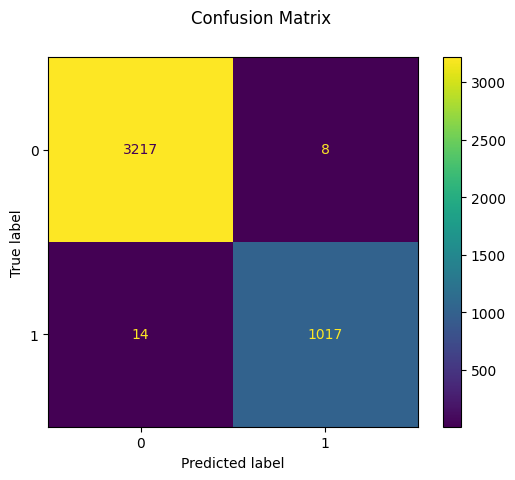

Classification report for classifier DecisionTreeClassifier(class_weight={0: 2.0, 1: 1.0},
                       min_impurity_decrease=0.0001, min_samples_split=20,
                       random_state=0):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3225
           1       0.99      0.99      0.99      1031

    accuracy                           0.99      4256
   macro avg       0.99      0.99      0.99      4256
weighted avg       0.99      0.99      0.99      4256




In [286]:
X = ablation_data[ablation_features]
y = ablation_data["official_type"]
weights = {0:2.0, 1:1.0}

# Split data into 80% train and 20% test subsets
X_train, X_test, y_train, y_test = train_test_split(\
    X, y, test_size=0.2, shuffle=True)
dt_split = DecisionTreeClassifier(class_weight=weights,min_samples_split=20, \
                                random_state=0,min_impurity_decrease = 0.0001)

#dt_split = DecisionTreeClassifier(min_samples_split=20, random_state=0,min_impurity_decrease = 0.0001)

# Learn on the train subset
dt_split.fit(X_train, y_train)

# Predict the target on the test subset
predicted = dt_split.predict(X_test)

# 1 = RES; 0 = NON_RES

disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, predicted)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

print(
    f"Classification report for classifier {dt_split}:\n"
    f"{metrics.classification_report(y_test, predicted)}\n"
)

In [285]:
print(y_test.value_counts())

official_type
0    3235
1    1021
Name: count, dtype: int64
